# 2) EDA

Here is all the exploratory data analysis we did on our cleaned data to determine what features we would use for our models.

In [1]:
# imports
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.dates as mdates
import seaborn as sns
import geopandas as gpd

%config InlineBackend.figure_format='retina'
%matplotlib inline

## Mask Use EDA

In [2]:
# read the CSV files

df = pd.read_csv('../clean_data/cases_with_mask_use.csv')

In [3]:
# check how many null values are in each
df.isnull().sum()

county                 0
totalcountconfirmed    0
totalcountdeaths       0
newcountconfirmed      0
newcountdeaths         0
date                   0
NEVER                  0
RARELY                 0
SOMETIMES              0
FREQUENTLY             0
ALWAYS                 0
population             0
dtype: int64

In [4]:
# check whether all the columns are in the dtype we want
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18124 entries, 0 to 18123
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   county               18124 non-null  object 
 1   totalcountconfirmed  18124 non-null  float64
 2   totalcountdeaths     18124 non-null  float64
 3   newcountconfirmed    18124 non-null  int64  
 4   newcountdeaths       18124 non-null  int64  
 5   date                 18124 non-null  object 
 6   NEVER                18124 non-null  float64
 7   RARELY               18124 non-null  float64
 8   SOMETIMES            18124 non-null  float64
 9   FREQUENTLY           18124 non-null  float64
 10  ALWAYS               18124 non-null  float64
 11  population           18124 non-null  int64  
dtypes: float64(7), int64(3), object(2)
memory usage: 1.7+ MB


In [5]:
# check how many counties we have
df.nunique()

county                   58
totalcountconfirmed    8392
totalcountdeaths       1341
newcountconfirmed      1392
newcountdeaths          128
date                    313
NEVER                    37
RARELY                   38
SOMETIMES                46
FREQUENTLY               45
ALWAYS                   54
population               58
dtype: int64

In [6]:
df.describe()

,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population
count,1.812400e+04,18124.000000,18124.000000,18124.000000,18124.000000,18124.000000,18124.000000,18124.000000,18124.000000,1.812400e+04
mean,1.327444e+04,210.774443,173.013187,2.048003,0.032279,0.030699,0.063650,0.158545,0.714792,6.823606e+05
std,5.201773e+04,852.430551,814.985729,11.017366,0.028533,0.026178,0.033898,0.040410,0.092762,1.456208e+06
min,0.000000e+00,0.000000,-1157.000000,-16.000000,0.001000,0.000000,0.004000,0.058000,0.482000,1.129000e+03
25%,9.400000e+01,1.000000,1.000000,0.000000,0.015000,0.013000,0.040000,0.134000,0.661000,4.590500e+04
50%,1.044000e+03,15.000000,14.000000,0.000000,0.023000,0.023000,0.058000,0.156000,0.737000,1.928430e+05
75%,8.147250e+03,114.000000,85.000000,0.000000,0.043000,0.043000,0.084000,0.186000,0.786000,7.621480e+05
max,1.048757e+06,15260.000000,28549.000000,318.000000,0.140000,0.135000,0.162000,0.276000,0.889000,1.003911e+07


In [7]:
df.columns

Index(['county', 'totalcountconfirmed', 'totalcountdeaths',
       'newcountconfirmed', 'newcountdeaths', 'date', 'NEVER', 'RARELY',
       'SOMETIMES', 'FREQUENTLY', 'ALWAYS', 'population'],
      dtype='object')

In [8]:
# fix dtype of date
df['date'] = pd.to_datetime(df['date'])

In [9]:
# sort the dataframe by name of counties & date
# check the top 5 lines 
df = df.sort_values(['county', 'date'])
df.head().tail()

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population
10612,Alameda,29.0,0.0,29,0,2020-03-18,0.019,0.008,0.055,0.123,0.795,1671329
10613,Alameda,36.0,0.0,7,0,2020-03-19,0.019,0.008,0.055,0.123,0.795,1671329
10614,Alameda,42.0,0.0,6,0,2020-03-20,0.019,0.008,0.055,0.123,0.795,1671329
10615,Alameda,62.0,0.0,20,0,2020-03-21,0.019,0.008,0.055,0.123,0.795,1671329
10616,Alameda,72.0,1.0,10,1,2020-03-22,0.019,0.008,0.055,0.123,0.795,1671329


In [10]:
# make new columns normalized to population
# popular metrics used lists numbers per 100K population, so follow the same method
df['confirmedper100k'] = df['totalcountconfirmed']/df['population']*100000
df['newlyconfirmedper100k'] = df['newcountconfirmed']/df['population']*100000
df['deathper100k'] = df['totalcountdeaths']/df['population']*100000
df['newdeath100k'] = df['newcountdeaths']/df['population']*100000

df.index

Int64Index([10612, 10613, 10614, 10615, 10616, 10617, 10618, 10619, 10620,
            10621,
            ...
             3119,  3120,  3121,  3122,  3123,  3124,  3125,  3126,  3127,
             3128],
           dtype='int64', length=18124)

In [11]:
# daily cases fluctuate a lot
# added 7-day rolling average columns to smooth out the variations 
df_bycounty = pd.DataFrame(df.groupby('county', sort=False)['newlyconfirmedper100k'].rolling(7).mean())
df_bycounty.set_index(keys=df.index, inplace=True)
df_bycounty.tail(30)
df_bycounty.columns = ['7dayrollingavg_newlyconfirmed']

merged = pd.merge(df, df_bycounty, left_index=True, right_index=True)

In [12]:
# repeat for daily deaths count
# pd. merge used to avoid conflict with groupby().rolling function 
df_bycounty2 = pd.DataFrame(df.groupby('county', sort=False)['newdeath100k'].rolling(7).mean())
df_bycounty2.set_index(keys=df.index, inplace=True)
df_bycounty2.columns = ['7dayrollingavg_newdeath']
merged2 = pd.merge(merged, df_bycounty2, left_index=True, right_index=True)

df = merged2.copy()
df.tail(30)

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population,confirmedper100k,newlyconfirmedper100k,deathper100k,newdeath100k,7dayrollingavg_newlyconfirmed,7dayrollingavg_newdeath
3099,Yuba,3599.0,17.0,50,0,2020-12-26,0.057,0.035,0.071,0.167,0.669,78668,4574.922459,63.558245,21.609803,0.000000,78.267439,0.363190
3100,Yuba,3665.0,17.0,66,0,2020-12-27,0.057,0.035,0.071,0.167,0.669,78668,4658.819342,83.896883,21.609803,0.000000,74.635539,0.363190
3101,Yuba,3679.0,17.0,14,0,2020-12-28,0.057,0.035,0.071,0.167,0.669,78668,4676.615651,17.796309,21.609803,0.000000,63.558245,0.363190
3102,Yuba,3723.0,18.0,44,1,2020-12-29,0.057,0.035,0.071,0.167,0.669,78668,4732.546906,55.931255,22.880968,1.271165,62.468675,0.544785
3103,Yuba,3756.0,18.0,33,0,2020-12-30,0.057,0.035,0.071,0.167,0.669,78668,4774.495348,41.948442,22.880968,0.000000,57.747205,0.363190
3104,Yuba,3799.0,19.0,43,1,2020-12-31,0.057,0.035,0.071,0.167,0.669,78668,4829.155438,54.660091,24.152133,1.271165,57.384015,0.363190
3105,Yuba,3845.0,19.0,46,0,2021-01-01,0.057,0.035,0.071,0.167,0.669,78668,4887.629023,58.473585,24.152133,0.000000,53.752116,0.363190
3106,Yuba,3930.0,19.0,85,0,2021-01-02,0.057,0.035,0.071,0.167,0.669,78668,4995.678039,108.049016,24.152133,0.000000,60.107940,0.363190
3107,Yuba,3966.0,19.0,36,0,2021-01-03,0.057,0.035,0.071,0.167,0.669,78668,5041.439976,45.761936,24.152133,0.000000,54.660091,0.363190
3108,Yuba,4023.0,21.0,57,2,2021-01-04,0.057,0.035,0.071,0.167,0.669,78668,5113.896375,72.456399,26.694463,2.542330,62.468675,0.726380


In [13]:
# last 4 columns have null values 
# because rolling window = 7, thus first 6 days for each county lists null values
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18124 entries, 10612 to 3128
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   county                         18124 non-null  object        
 1   totalcountconfirmed            18124 non-null  float64       
 2   totalcountdeaths               18124 non-null  float64       
 3   newcountconfirmed              18124 non-null  int64         
 4   newcountdeaths                 18124 non-null  int64         
 5   date                           18124 non-null  datetime64[ns]
 6   NEVER                          18124 non-null  float64       
 7   RARELY                         18124 non-null  float64       
 8   SOMETIMES                      18124 non-null  float64       
 9   FREQUENTLY                     18124 non-null  float64       
 10  ALWAYS                         18124 non-null  float64       
 11  population  

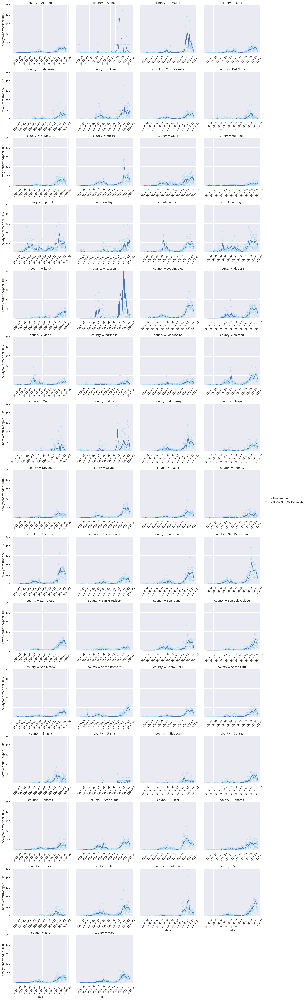

In [14]:
# graph the daily confirmed normalized by 100k population 
# light blue dots = normalized daily count
# dark blue line = 7-day rolling average
sns.set_theme(style="darkgrid")

g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True, ylim=(0,500))
g.map(sns.lineplot, "date", '7dayrollingavg_newlyconfirmed', label='7-Day Average')
g.map(sns.scatterplot, "date", 'newlyconfirmedper100k', alpha=.5, color='lightskyblue', label='DailyConfirmed per 100K')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()
g.add_legend()
g.savefig('../images/7_day_newly_confirmed_all_counties.png')

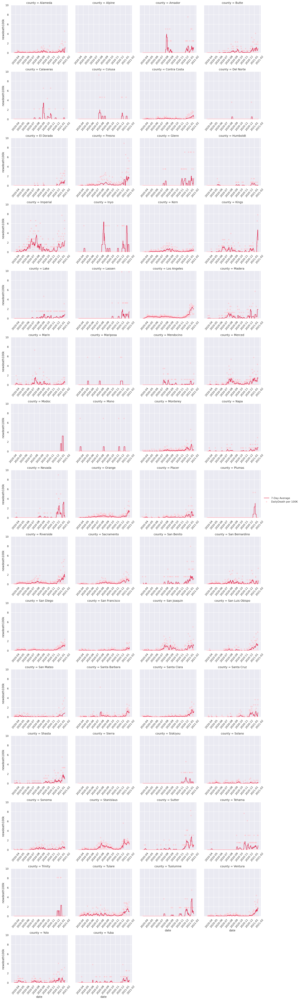

In [15]:
# graph the daily deaths normalized by 100k population 
# light pink dots = normalized daily deaths
# dark red line = 7-day rolling average

g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True, ylim=(0,10))
g.map(sns.lineplot, "date", '7dayrollingavg_newdeath', color='crimson', label='7-Day Average')
g.map(sns.scatterplot, "date", 'newdeath100k', alpha=.5, color='lightpink', label='DailyDeath per 100K')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()

g.add_legend()
g.savefig('../images/7_day_newly_death_all_counties.png')

- however, normalized graphs can exaggerate the fluctuations where the population is low
- ex) 1 confirmed out of 10 population = 10% increase
- in order to decide what constitutes as an "outbreak," let's look at the raw numbers before normalization 

In [16]:

# repeat the same process of generating a new column of rolling average
# but this time, use the raw numbers - NOT normalized per population



df_bycounty3 = pd.DataFrame(df.groupby('county', sort=False)['newcountconfirmed'].rolling(7).mean())
df_bycounty3.set_index(keys=df.index, inplace=True)
df_bycounty3.tail(30)
df_bycounty3.columns = ['7dayrollingavg_newlyconfirmed_rawnumber']

merged3 = pd.merge(df, df_bycounty3, left_index=True, right_index=True)

df_bycounty4 = pd.DataFrame(df.groupby('county', sort=False)['newcountdeaths'].rolling(7).mean())
df_bycounty4.set_index(keys=df.index, inplace=True)

df_bycounty4.columns = ['7dayrollingavg_newdeath_rawnumber']

merged4 = pd.merge(merged3, df_bycounty4, left_index=True, right_index=True)
df = merged4.copy()
df.tail(30)

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population,confirmedper100k,newlyconfirmedper100k,deathper100k,newdeath100k,7dayrollingavg_newlyconfirmed,7dayrollingavg_newdeath,7dayrollingavg_newlyconfirmed_rawnumber,7dayrollingavg_newdeath_rawnumber
3099,Yuba,3599.0,17.0,50,0,2020-12-26,0.057,0.035,0.071,0.167,0.669,78668,4574.922459,63.558245,21.609803,0.000000,78.267439,0.363190,61.571429,0.285714
3100,Yuba,3665.0,17.0,66,0,2020-12-27,0.057,0.035,0.071,0.167,0.669,78668,4658.819342,83.896883,21.609803,0.000000,74.635539,0.363190,58.714286,0.285714
3101,Yuba,3679.0,17.0,14,0,2020-12-28,0.057,0.035,0.071,0.167,0.669,78668,4676.615651,17.796309,21.609803,0.000000,63.558245,0.363190,50.000000,0.285714
3102,Yuba,3723.0,18.0,44,1,2020-12-29,0.057,0.035,0.071,0.167,0.669,78668,4732.546906,55.931255,22.880968,1.271165,62.468675,0.544785,49.142857,0.428571
3103,Yuba,3756.0,18.0,33,0,2020-12-30,0.057,0.035,0.071,0.167,0.669,78668,4774.495348,41.948442,22.880968,0.000000,57.747205,0.363190,45.428571,0.285714
3104,Yuba,3799.0,19.0,43,1,2020-12-31,0.057,0.035,0.071,0.167,0.669,78668,4829.155438,54.660091,24.152133,1.271165,57.384015,0.363190,45.142857,0.285714
3105,Yuba,3845.0,19.0,46,0,2021-01-01,0.057,0.035,0.071,0.167,0.669,78668,4887.629023,58.473585,24.152133,0.000000,53.752116,0.363190,42.285714,0.285714
3106,Yuba,3930.0,19.0,85,0,2021-01-02,0.057,0.035,0.071,0.167,0.669,78668,4995.678039,108.049016,24.152133,0.000000,60.107940,0.363190,47.285714,0.285714
3107,Yuba,3966.0,19.0,36,0,2021-01-03,0.057,0.035,0.071,0.167,0.669,78668,5041.439976,45.761936,24.152133,0.000000,54.660091,0.363190,43.000000,0.285714
3108,Yuba,4023.0,21.0,57,2,2021-01-04,0.057,0.035,0.071,0.167,0.669,78668,5113.896375,72.456399,26.694463,2.542330,62.468675,0.726380,49.142857,0.571429


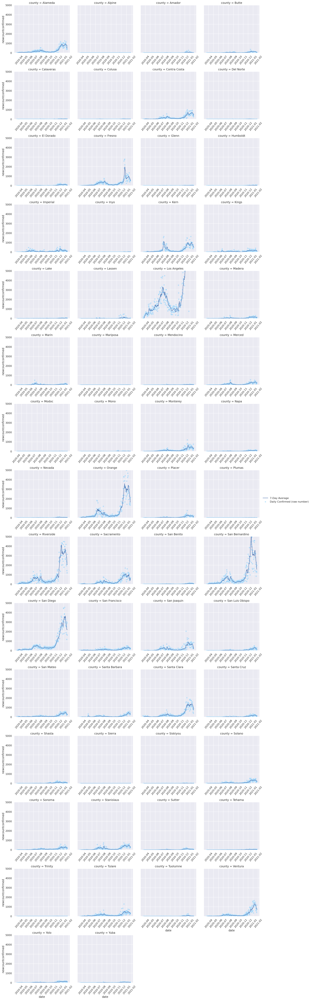

In [17]:
# graph the raw number of confirmed cases for each county
# on same y-axis scale to show the population differences among counties 


sns.set_theme(style="darkgrid")

g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True, ylim=(0,5000))
g.map(sns.lineplot, "date", '7dayrollingavg_newlyconfirmed_rawnumber', label='7-Day Average')
g.map(sns.scatterplot, "date", 'newcountconfirmed', alpha=.5, color='lightskyblue', label='Daily Confirmed (raw number)')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()
g.add_legend()
g.savefig('../images/7_day_newly_confirmed_raw_allcounties.png')

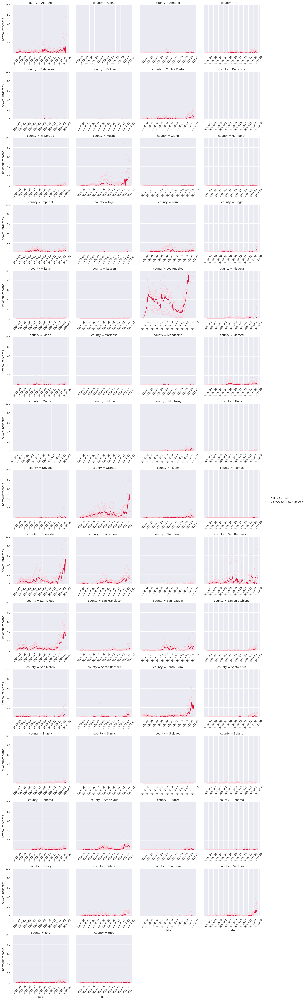

In [18]:
# graph the raw number of confirmed deaths for each county
# on same y-axis scale to show the population differences among counties 



g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True, ylim=(0,100))
g.map(sns.lineplot, "date", '7dayrollingavg_newdeath_rawnumber', color='crimson', label='7-Day Average')
g.map(sns.scatterplot, "date", 'newcountdeaths', alpha=.5, color='lightpink', label='DailyDeath (raw number)')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()

g.add_legend()
g.savefig('../images/7_day_new_death_raw_allcounties.png')

In [19]:
df.corr()

,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population,confirmedper100k,newlyconfirmedper100k,deathper100k,newdeath100k,7dayrollingavg_newlyconfirmed,7dayrollingavg_newdeath,7dayrollingavg_newlyconfirmed_rawnumber,7dayrollingavg_newdeath_rawnumber
totalcountconfirmed,1.000000,0.952152,0.862535,0.786206,-0.082041,-0.124061,-0.087094,-0.121452,0.144905,0.671178,0.352683,0.217995,0.365960,0.125971,0.309678,0.244810,0.917632,0.879138
totalcountdeaths,0.952152,1.000000,0.775836,0.736563,-0.083868,-0.129131,-0.090945,-0.125952,0.150311,0.784920,0.270181,0.152382,0.346929,0.102521,0.213375,0.200493,0.818124,0.828843
newcountconfirmed,0.862535,0.775836,1.000000,0.746039,-0.067903,-0.102571,-0.077111,-0.100993,0.121949,0.559097,0.294758,0.297651,0.282553,0.120462,0.348735,0.220313,0.952499,0.791782
newcountdeaths,0.786206,0.736563,0.746039,1.000000,-0.062567,-0.094891,-0.068348,-0.089852,0.110170,0.569845,0.221587,0.158146,0.244035,0.258356,0.221230,0.261787,0.779790,0.884718
NEVER,-0.082041,-0.083868,-0.067903,-0.062567,1.000000,0.322358,0.208306,0.153044,-0.539913,-0.157277,-0.068782,-0.024998,-0.156342,-0.034377,-0.034474,-0.069058,-0.070950,-0.071072
RARELY,-0.124061,-0.129131,-0.102571,-0.094891,0.322358,1.000000,0.426194,0.379214,-0.701183,-0.219867,-0.104639,-0.042325,-0.225176,-0.058746,-0.057695,-0.117911,-0.107246,-0.107990
SOMETIMES,-0.087094,-0.090945,-0.077111,-0.068348,0.208306,0.426194,1.000000,0.570605,-0.796948,-0.173361,0.045675,0.042074,-0.107444,-0.010188,0.060485,-0.022365,-0.080499,-0.077418
FREQUENTLY,-0.121452,-0.125952,-0.100993,-0.089852,0.153044,0.379214,0.570605,1.000000,-0.796283,-0.198776,-0.095379,-0.030752,-0.190242,-0.036599,-0.041133,-0.075940,-0.105559,-0.102271
ALWAYS,0.144905,0.150311,0.121949,0.110170,-0.539913,-0.701183,-0.796948,-0.796283,1.000000,0.260565,0.075490,0.017632,0.233299,0.046747,0.022675,0.095612,0.127428,0.125208
population,0.671178,0.784920,0.559097,0.569845,-0.157277,-0.219867,-0.173361,-0.198776,0.260565,1.000000,0.090569,0.054067,0.184707,0.050257,0.074816,0.098740,0.584783,0.649439


In [20]:
df.to_csv('../clean_data/Cases_Normalized_per_100k.csv', index=False) 

## Hospital Beds EDA

In [21]:
# read the CSV files

df = pd.read_csv('../clean_data/hospitals_by_county.csv')

In [22]:
df_mask = pd.read_csv('../clean_data/Cases_Normalized_per_100k.csv')

## mask.csv basic inspection

In [23]:
# check the size of dataframes  
df.shape

(16909, 9)

In [24]:
# check how many null values are in each

df.isnull().sum()


county                                     0
todays_date                                0
hospitalized_covid_confirmed_patients      0
hospitalized_suspected_covid_patients      0
hospitalized_covid_patients                0
all_hospital_beds                        215
icu_covid_confirmed_patients               7
icu_suspected_covid_patients               7
icu_available_beds                       215
dtype: int64

In [25]:
# check how many counties we have

df_mask.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18124 entries, 0 to 18123
Data columns (total 20 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   county                                   18124 non-null  object 
 1   totalcountconfirmed                      18124 non-null  float64
 2   totalcountdeaths                         18124 non-null  float64
 3   newcountconfirmed                        18124 non-null  int64  
 4   newcountdeaths                           18124 non-null  int64  
 5   date                                     18124 non-null  object 
 6   NEVER                                    18124 non-null  float64
 7   RARELY                                   18124 non-null  float64
 8   SOMETIMES                                18124 non-null  float64
 9   FREQUENTLY                               18124 non-null  float64
 10  ALWAYS                                   18124

In [26]:
df.head()

,county,todays_date,hospitalized_covid_confirmed_patients,hospitalized_suspected_covid_patients,hospitalized_covid_patients,all_hospital_beds,icu_covid_confirmed_patients,icu_suspected_covid_patients,icu_available_beds
0,Plumas,2020-03-29,0.0,1.0,1.0,NaN,0.0,1.0,NaN
1,Tehama,2020-03-29,0.0,0.0,0.0,308.0,0.0,0.0,2.0
2,Glenn,2020-03-29,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,Mono,2020-03-29,0.0,1.0,1.0,308.0,0.0,0.0,2.0
4,Marin,2020-03-29,7.0,13.0,20.0,493.0,2.0,6.0,11.0


In [27]:
df['date'] = pd.to_datetime(df['todays_date'])
df_mask['date'] = pd.to_datetime(df_mask['date'])

In [28]:
df = df.sort_values(['county', 'todays_date'])
df.set_index(['county', 'date'])

todays_date  hospitalized_covid_confirmed_patients  \
county  date                                                            
Alameda 2020-03-29  2020-03-29                                   36.0   
        2020-03-30  2020-03-30                                   59.0   
        2020-03-31  2020-03-31                                   56.0   
        2020-04-01  2020-04-01                                   52.0   
        2020-04-02  2020-04-02                                   57.0   
...                        ...                                    ...   
Yuba    2021-01-20  2021-01-20                                   44.0   
        2021-01-21  2021-01-21                                   42.0   
        2021-01-22  2021-01-22                                   45.0   
        2021-01-23  2021-01-23                                   49.0   
        2021-01-24  2021-01-24                                   53.0   

                    hospitalized_suspected_covid_patients  \
county  date                                                
Alameda 2020-03-29                                   91.0   
        2020-03-30                                   89.0   
        2020-03-31                                   94.0   
        2020-04-01                                   76.0   
        2020-04-02                                   76.0   
...                                                   ...   
Yuba    2021-01-20                                    0.0   
        2021-01-21                                    2.0   
        2021-01-22                                    0.0   
        2021-01-23                                    0.0   
        2021-01-24                                    0.0   

                    hospitalized_covid_patients  all_hospital_beds  \
county  date                                                         
Alameda 2020-03-29                        127.0             2725.0   
        2020-03-30                        148.0             3283.0   
        2020-03-31                        150.0             1857.0   
        2020-04-01                        128.0             2456.0   
        2020-04-02                        133.0             2580.0   
...                                         ...                ...   
Yuba    2021-01-20                         44.0              261.0   
        2021-01-21                         44.0              261.0   
        2021-01-22                         45.0              261.0   
        2021-01-23                         49.0              261.0   
        2021-01-24                         53.0              261.0   

                    icu_covid_confirmed_patients  \
county  date                                       
Alameda 2020-03-29                          20.0   
        2020-03-30                          27.0   
        2020-03-31                          27.0   
        2020-04-01                          27.0   
        2020-04-02                          29.0   
...                                          ...   
Yuba    2021-01-20                          16.0   
        2021-01-21                          13.0   
        2021-01-22                          12.0   
        2021-01-23                          12.0   
        2021-01-24                          12.0   

                    icu_suspected_covid_patients  icu_available_beds  
county  date                                                          
Alameda 2020-03-29                          16.0               119.0  
        2020-03-30                          18.0               146.0  
        2020-03-31                          17.0                77.0  
        2020-04-01                          15.0               106.0  
        2020-04-02                          17.0               112.0  
...                                          ...                 ...  
Yuba    2021-01-20                           0.0                 2.0  
        2021-01-21                           0.0

In [29]:
merged = pd.merge(df, df_mask[['county', 'date', 'population']], on=['county', 'date'])

In [30]:
merged.drop(columns=['todays_date'])

,county,hospitalized_covid_confirmed_patients,hospitalized_suspected_covid_patients,hospitalized_covid_patients,all_hospital_beds,icu_covid_confirmed_patients,icu_suspected_covid_patients,icu_available_beds,date,population
0,Alameda,36.0,91.0,127.0,2725.0,20.0,16.0,119.0,2020-03-29,1671329
1,Alameda,59.0,89.0,148.0,3283.0,27.0,18.0,146.0,2020-03-30,1671329
2,Alameda,56.0,94.0,150.0,1857.0,27.0,17.0,77.0,2020-03-31,1671329
3,Alameda,52.0,76.0,128.0,2456.0,27.0,15.0,106.0,2020-04-01,1671329
4,Alameda,57.0,76.0,133.0,2580.0,29.0,17.0,112.0,2020-04-02,1671329
...,...,...,...,...,...,...,...,...,...,...
16898,Yuba,44.0,0.0,44.0,261.0,16.0,0.0,2.0,2021-01-20,78668
16899,Yuba,42.0,2.0,44.0,261.0,13.0,0.0,2.0,2021-01-21,78668
16900,Yuba,45.0,0.0,45.0,261.0,12.0,0.0,2.0,2021-01-22,78668
16901,Yuba,49.0,0.0,49.0,261.0,12.0,0.0,3.0,2021-01-23,78668


In [31]:
df = merged.copy()

In [32]:
df['icu_covid_patients'] = df['icu_covid_confirmed_patients'] + df['icu_suspected_covid_patients']

In [33]:

# make new columns normalized to population
# popular metrics used lists numbers per 100K population, so follow the same method

df['hospitalizedper100k'] = df['hospitalized_covid_patients']/df['population']*100000
df['ICUpatientsper100k'] = df['icu_covid_patients']/df['population']*100000
df['hospitalbedavailable100k'] = df['all_hospital_beds']/df['population']*100000
df['icubedavailableper100k'] = df['icu_available_beds']/df['population']*100000


In [34]:
# daily cases fluctuate a lot
# added 7-day rolling average columns to smooth out the variations 

df_bycounty = pd.DataFrame(df.groupby('county', sort=False)['hospitalizedper100k'].rolling(7).mean())
df_bycounty.set_index(keys=df.index, inplace=True)
df_bycounty.tail(30)
df_bycounty.columns = ['7dayrollingavg_hospitalizedper100k']

merged = pd.merge(df, df_bycounty, left_index=True, right_index=True)



In [35]:
# repeat for daily deaths count
# pd. merge used to avoid conflict with groupby().rolling function 


df_bycounty2 = pd.DataFrame(df.groupby('county', sort=False)['ICUpatientsper100k'].rolling(7).mean())
df_bycounty2.set_index(keys=df.index, inplace=True)

df_bycounty2.columns = ['7dayrollingavg_ICUpatientsper100k']

merged2 = pd.merge(merged, df_bycounty2, left_index=True, right_index=True)


df = merged2.copy()
df.tail(30)

,county,todays_date,hospitalized_covid_confirmed_patients,hospitalized_suspected_covid_patients,hospitalized_covid_patients,all_hospital_beds,icu_covid_confirmed_patients,icu_suspected_covid_patients,icu_available_beds,date,population,icu_covid_patients,hospitalizedper100k,ICUpatientsper100k,hospitalbedavailable100k,icubedavailableper100k,7dayrollingavg_hospitalizedper100k,7dayrollingavg_ICUpatientsper100k
16873,Yuba,2020-12-26,65.0,2.0,67.0,261.0,13.0,1.0,2.0,2020-12-26,78668,14.0,85.168048,17.796309,331.774038,2.542330,77.541059,12.893244
16874,Yuba,2020-12-27,68.0,1.0,69.0,261.0,14.0,0.0,1.0,2020-12-27,78668,14.0,87.710378,17.796309,331.774038,1.271165,79.538603,13.619624
16875,Yuba,2020-12-28,67.0,0.0,67.0,261.0,14.0,0.0,1.0,2020-12-28,78668,14.0,85.168048,17.796309,331.774038,1.271165,80.446578,14.527599
16876,Yuba,2020-12-29,72.0,0.0,72.0,261.0,18.0,0.0,1.0,2020-12-29,78668,18.0,91.523872,22.880968,331.774038,1.271165,82.080933,16.161954
16877,Yuba,2020-12-30,73.0,25.0,98.0,261.0,18.0,0.0,0.0,2020-12-30,78668,18.0,124.574160,22.880968,331.774038,0.000000,89.344733,18.159499
16878,Yuba,2020-12-31,69.0,23.0,92.0,261.0,17.0,0.0,1.0,2020-12-31,78668,17.0,116.947170,21.609803,331.774038,1.271165,95.700557,19.612258
16879,Yuba,2021-01-01,69.0,17.0,86.0,261.0,20.0,0.0,1.0,2021-01-01,78668,20.0,109.320181,25.423298,331.774038,1.271165,100.058837,20.883423
16880,Yuba,2021-01-02,69.0,12.0,81.0,261.0,20.0,0.0,1.0,2021-01-02,78668,20.0,102.964357,25.423298,331.774038,1.271165,102.601167,21.972993
16881,Yuba,2021-01-03,71.0,7.0,78.0,261.0,18.0,0.0,1.0,2021-01-03,78668,18.0,99.150862,22.880968,331.774038,1.271165,104.235521,22.699373
16882,Yuba,2021-01-04,68.0,2.0,70.0,261.0,17.0,1.0,1.0,2021-01-04,78668,18.0,88.981543,22.880968,331.774038,1.271165,104.780306,23.425753


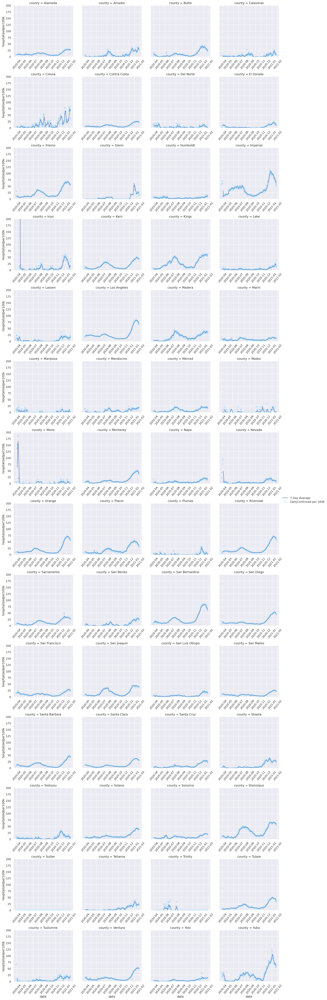

In [36]:
# graph the daily hospitalized (total of confirmed & suspected) normalized by 100k population 
# light blue dots = normalized daily count
# dark blue line = 7-day rolling average


sns.set_theme(style="darkgrid")

g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True, ylim=(0,200))
g.map(sns.lineplot, "date", '7dayrollingavg_hospitalizedper100k', label='7-Day Average')
g.map(sns.scatterplot, "date", 'hospitalizedper100k', alpha=.5, color='lightskyblue', label='DailyConfirmed per 100K')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()
g.add_legend()
g.savefig('../images/7_day_all_counties_hospitalized.png');

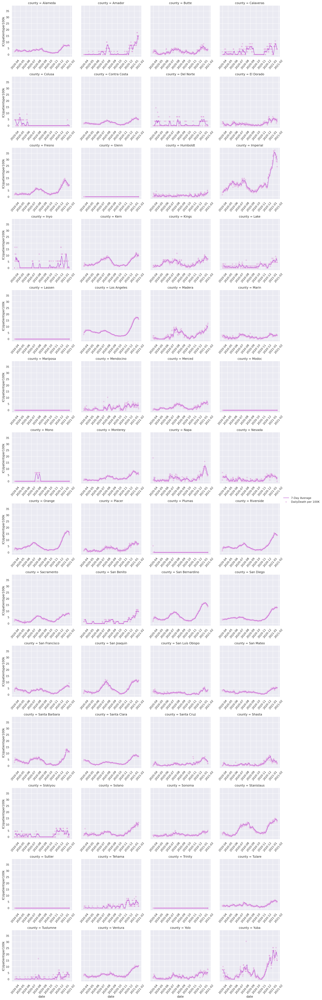

In [37]:
# graph the daily ICU patients normalized by 100k population 
# light pink dots = normalized 
# dark purple line = 7-day rolling average

g = sns.FacetGrid(df, col="county", col_wrap=4, height=4, aspect=1, sharex=False, margin_titles=True)
g.map(sns.lineplot, "date", '7dayrollingavg_ICUpatientsper100k', color='mediumorchid', label='7-Day Average')
g.map(sns.scatterplot, "date", 'ICUpatientsper100k', alpha=.5, color='plum', label='DailyDeath per 100K')

xformatter = mdates.DateFormatter("%y/%m")

g.axes[0].xaxis.set_major_formatter(xformatter)

g.set_xticklabels(rotation=50)
g.fig.tight_layout()

g.add_legend()
g.savefig('../images/7_day_ICU_all_counties.png');

## Vaccine Allocation EDA

In [2]:
vaccine=pd.read_csv('../clean_data/vaccine_population.csv')

In [3]:
vaccine.shape

(52, 12)

In [4]:
#normalize the total first dose allocation, use it devided by total population per state

vaccine['al_over_po']=vaccine['total_first_allocation']/vaccine['2019_population']

In [5]:
vaccine.head()

,jurisdiction,2019_population,hhs_region,doses_allocated_12_14,doses_allocated_12_21,doses_allocated_12_28,doses_allocated_01_04,doses_allocated_01_10,doses_allocated_01_18,doses_allocated_01_25,doses_allocated_02_01,total_first_allocation,al_over_po
0,Alabama,4903185,Region 4,40950,113550,67125,58250,58350,60825,60825,70625,530500,0.108195
1,Alaska,731545,Region 10,35100,26800,0,52900,0,0,0,59600,174400,0.238400
2,Arizona,7278717,Region 9,58500,161325,94925,83025,83225,86300,86300,100100,753700,0.103548
3,Arkansas,3017804,Region 6,25350,69625,41100,36125,36225,37125,37125,43025,325700,0.107926
4,California,39512223,Region 9,327600,905625,529675,463450,465325,485800,485800,562825,4226100,0.106957


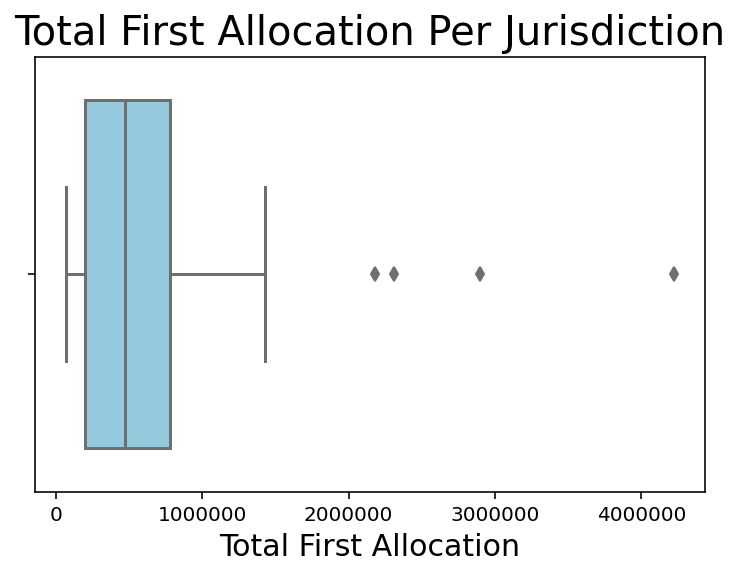

In [6]:
sns.boxplot(x=vaccine['total_first_allocation'],color='skyblue')
plt.ticklabel_format(style='plain',axis='x')
plt.title('Total First Allocation Per Jurisdiction', size=20)
plt.xlabel('Total First Allocation',size=15);

# there are 4 jurisdictions has way more allocations than other jurisdiction

In [7]:
vaccine.sort_values(by=['total_first_allocation'], ascending=False)[:4]

# California has the most allocation, then it's Texas, Florida and New York

,jurisdiction,2019_population,hhs_region,doses_allocated_12_14,doses_allocated_12_21,doses_allocated_12_28,doses_allocated_01_04,doses_allocated_01_10,doses_allocated_01_18,doses_allocated_01_25,doses_allocated_02_01,total_first_allocation,al_over_po
4,California,39512223,Region 9,327600,905625,529675,463450,465325,485800,485800,562825,4226100,0.106957
43,Texas,28995881,Region 6,224250,620400,362875,317425,319000,332850,332850,385275,2894925,0.099839
9,Florida,21477737,Region 4,179400,495625,289925,253350,254825,266100,266100,307725,2313050,0.107695
32,New York,19453561,Region 2,169650,466125,273650,239025,239525,250400,250400,289525,2178300,0.111974


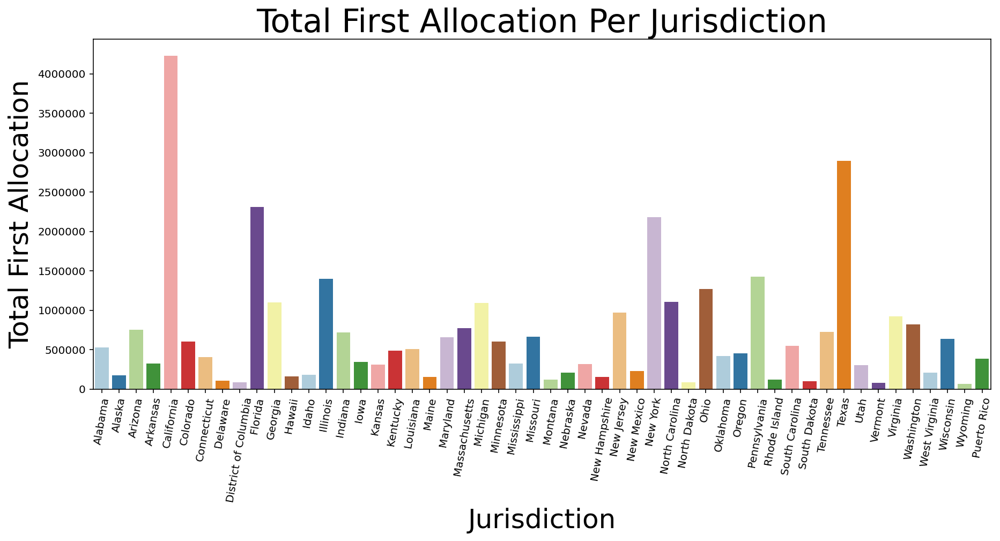

In [9]:
plt.figure(figsize=(15,6))
sns.barplot(data=vaccine,y=vaccine['total_first_allocation'],x=vaccine['jurisdiction'],
            palette='Paired')
plt.ticklabel_format(style='plain',axis='y')
plt.xlabel("Jurisdiction",size=25)
plt.ylabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction',size=30)

plt.xticks(rotation=80);

# Total first allocation per jurisdiction with alphabet order

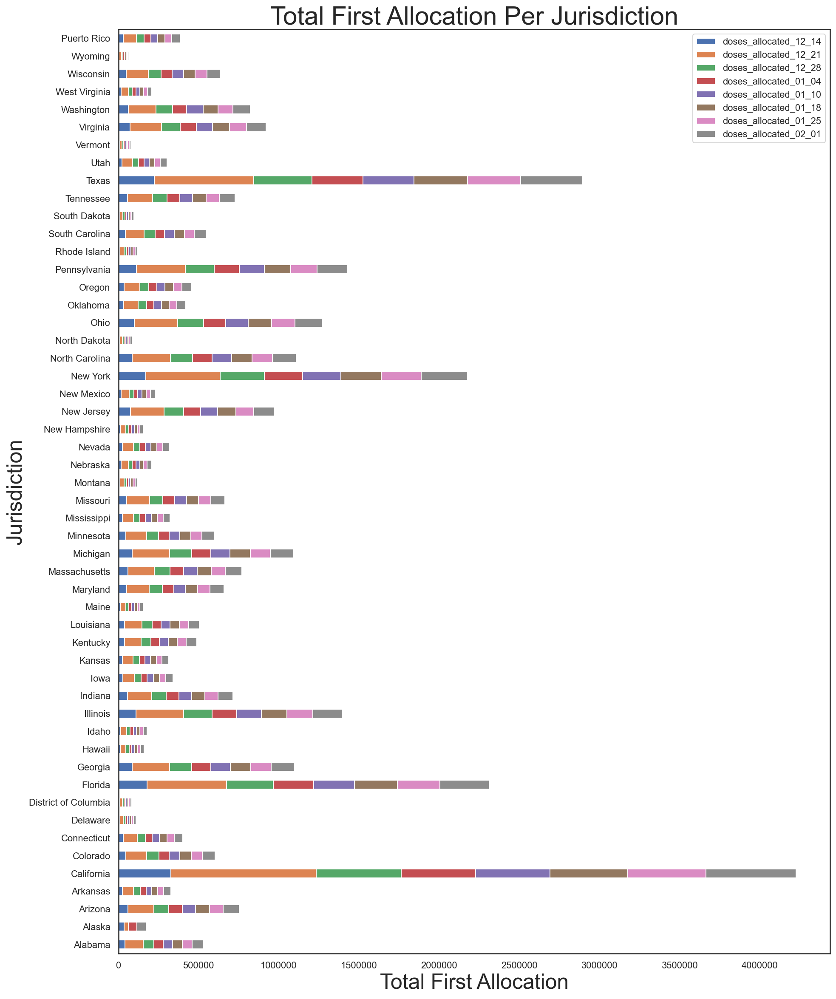

In [10]:
sns.set(style='white')

ax=vaccine.drop(['total_first_allocation','2019_population','al_over_po'],axis=1).\
plot.barh(stacked=True,figsize=(15,20))

plt.ticklabel_format(style='plain',axis='x')
ax.set_yticklabels(vaccine.jurisdiction)
plt.ylabel("Jurisdiction",size=25)
plt.xlabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction',size=30);

#total first allocation per jurisdiction on a stacked bar chart, with alphabet order

## Plot some graphies in the oder of total allocations

In [11]:
vaccine_sort=vaccine.sort_values(by=['total_first_allocation'], 
                                 ascending=False).drop(columns=['2019_population'])
vaccine_sort.head()

,jurisdiction,hhs_region,doses_allocated_12_14,doses_allocated_12_21,doses_allocated_12_28,doses_allocated_01_04,doses_allocated_01_10,doses_allocated_01_18,doses_allocated_01_25,doses_allocated_02_01,total_first_allocation,al_over_po
4,California,Region 9,327600,905625,529675,463450,465325,485800,485800,562825,4226100,0.106957
43,Texas,Region 6,224250,620400,362875,317425,319000,332850,332850,385275,2894925,0.099839
9,Florida,Region 4,179400,495625,289925,253350,254825,266100,266100,307725,2313050,0.107695
32,New York,Region 2,169650,466125,273650,239025,239525,250400,250400,289525,2178300,0.111974
38,Pennsylvania,Region 3,111150,305375,179600,156875,157175,164000,164000,190300,1428475,0.111582


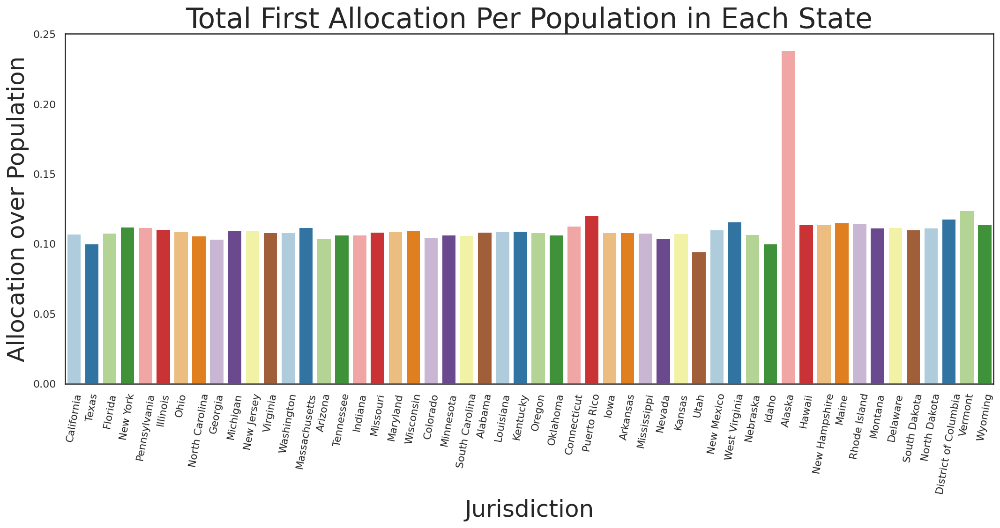

In [106]:
plt.figure(figsize=(15,8))

sns.barplot(data=vaccine_sort,
            y=vaccine_sort['al_over_po'],x=vaccine_sort['jurisdiction'],
            palette="Paired")#,order=vaccine_sort.jurisdiction)
#plt.ticklabel_format(style='plain',axis='y')
plt.xlabel("Jurisdiction",size=25)
plt.ylabel("Allocation over Population",size=25)
plt.title('Total First Allocation Per Population in Each State',size=30)

plt.xticks(rotation=80);

plt.tight_layout()
plt.savefig('../images/allocation_over_population_per_state.png')

#total first dose allocation per population with the total allocation in descending order

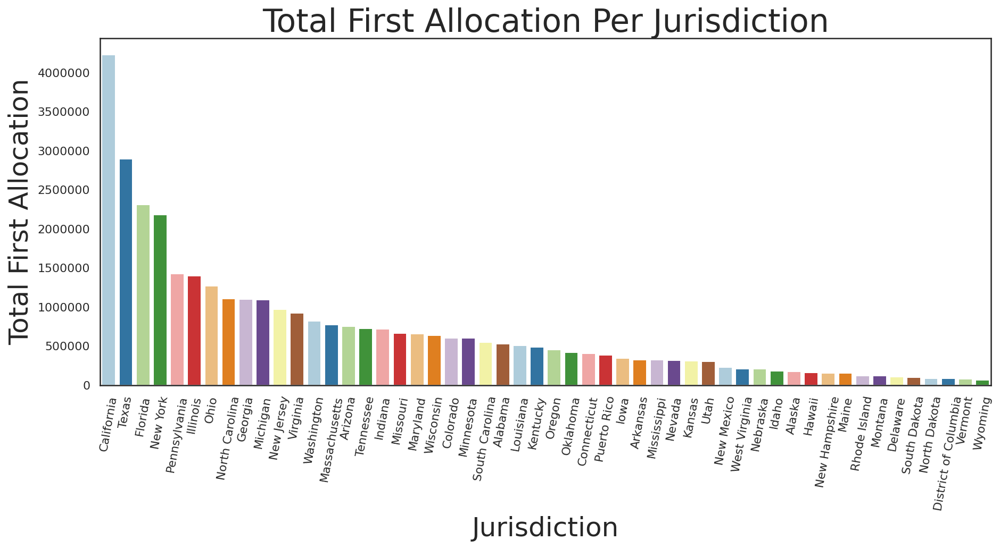

In [107]:
plt.figure(figsize=(15,6))
sns.barplot(data=vaccine_sort.drop('al_over_po',axis=1),
            y=vaccine_sort['total_first_allocation'],x=vaccine_sort['jurisdiction'],
            palette='Paired')#,order=vaccine_sort.jurisdiction)
plt.ticklabel_format(style='plain',axis='y')
plt.xlabel("Jurisdiction",size=25)
plt.ylabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction',size=30)

plt.xticks(rotation=80);
plt.savefig('../images/total_allocation_per_state.png')
#total first allocation per jurisdiction with the total allocation in descending order

In [108]:
vaccine_sort_10=vaccine_sort[:10].reset_index(drop=True)
vaccine_sort_10.head()

,jurisdiction,hhs_region,doses_allocated_12_14,doses_allocated_12_21,doses_allocated_12_28,doses_allocated_01_04,doses_allocated_01_10,doses_allocated_01_18,doses_allocated_01_25,doses_allocated_02_01,total_first_allocation,al_over_po
0,California,Region 9,327600,905625,529675,463450,465325,485800,485800,562825,4226100,0.106957
1,Texas,Region 6,224250,620400,362875,317425,319000,332850,332850,385275,2894925,0.099839
2,Florida,Region 4,179400,495625,289925,253350,254825,266100,266100,307725,2313050,0.107695
3,New York,Region 2,169650,466125,273650,239025,239525,250400,250400,289525,2178300,0.111974
4,Pennsylvania,Region 3,111150,305375,179600,156875,157175,164000,164000,190300,1428475,0.111582


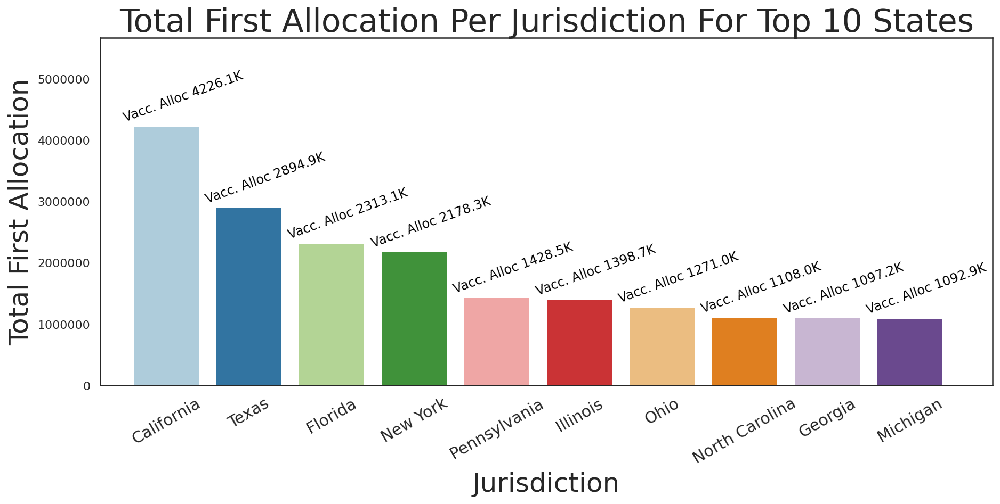

In [109]:
plt.figure(figsize=(15,6))

g=sns.barplot(data=vaccine_sort_10,y=vaccine_sort_10['total_first_allocation'],
              x=vaccine_sort_10['jurisdiction'],palette='Paired')

plt.ticklabel_format(style='plain',axis='y')
plt.xlabel("Jurisdiction",size=25)
plt.ylabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction For Top 10 States',size=30)
plt.ylim([0,5663275])
plt.xlim([-0.8,10])
plt.xticks(rotation=30,size=15)

#n=-1
for index, row in vaccine_sort_10.iterrows():
    #n+=1
    g.text(row.name+0.2,row.total_first_allocation+80000,
           'Vacc. Alloc'' ''{0:.1f}K'.format(row.total_first_allocation/1000),
           color='black',ha='center',rotation=20)

    

In [110]:
vaccine_sort_no_total=vaccine.sort_values(by=['total_first_allocation'], \
                                          ascending=True).drop(['total_first_allocation','2019_population','al_over_po'],axis=1)
vaccine_sort_no_total=vaccine_sort_no_total.set_index('jurisdiction')

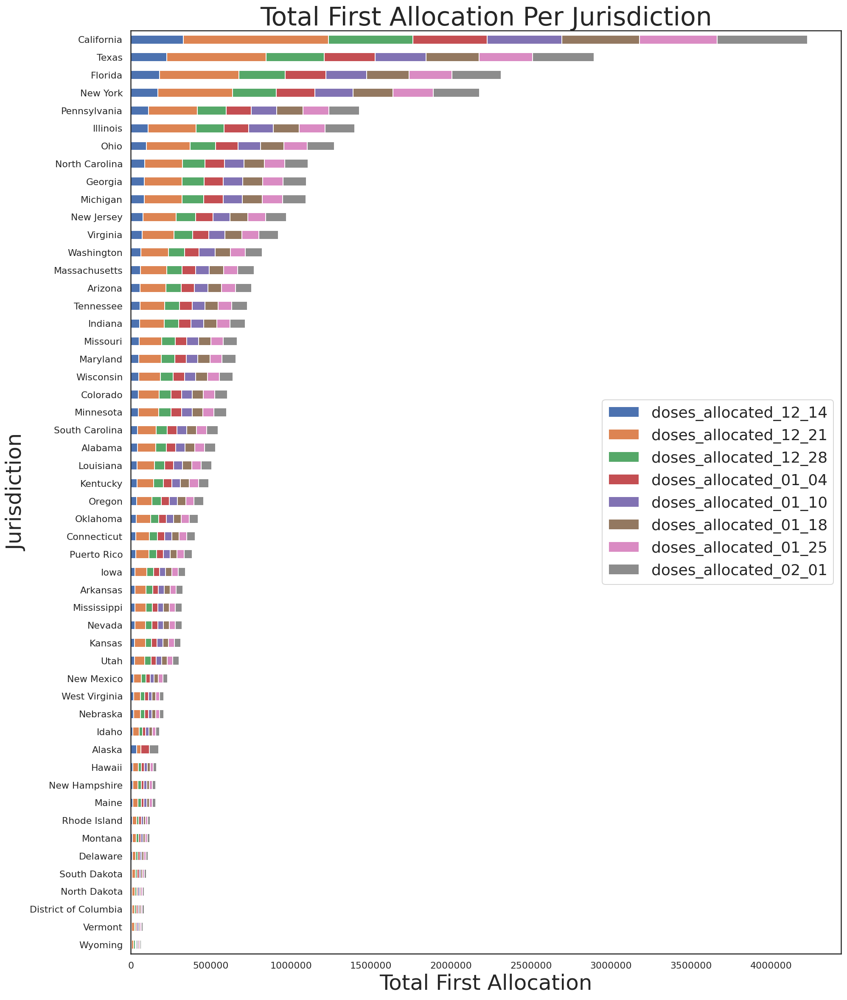

In [111]:
sns.set(style='white')
ax=vaccine_sort_no_total.plot(kind='barh',stacked=True,figsize=(15,20))
plt.ticklabel_format(style='plain',axis='x')
ax.set_yticklabels(vaccine_sort_no_total.index)
plt.ylabel("Jurisdiction",size=25)
plt.xlabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction',size=30)
plt.legend(fontsize=18,loc='center right');

plt.savefig('../images/total_first_per_state_per_date.png')

#total first allocation per jurisdiction with total allocation in descending order

# add population into graphies

In [112]:
vaccine.tail()

,jurisdiction,2019_population,hhs_region,doses_allocated_12_14,doses_allocated_12_21,doses_allocated_12_28,doses_allocated_01_04,doses_allocated_01_10,doses_allocated_01_18,doses_allocated_01_25,doses_allocated_02_01,total_first_allocation,al_over_po
47,Washington,7614893,Region 10,62400,172850,101825,88950,101825,93300,93300,107125,821575,0.107891
48,West Virginia,1792147,Region 3,16575,44300,25925,22900,23000,23600,23600,27300,207200,0.115616
49,Wisconsin,5822434,Region 5,49725,136100,79750,69800,70000,73750,73750,84375,637250,0.109447
50,Wyoming,578759,Region 8,4875,13900,8375,7400,7400,7600,7600,8700,65850,0.113778
51,Puerto Rico,3193694,Region 2,30225,81850,48200,42250,42350,44325,44325,51325,384850,0.120503


In [113]:
# make a dataframe with only the state, population and total allocation

state_pop_vac=vaccine[['jurisdiction','2019_population','total_first_allocation']].copy()
state_pop_vac.head()

,jurisdiction,2019_population,total_first_allocation
0,Alabama,4903185,530500
1,Alaska,731545,174400
2,Arizona,7278717,753700
3,Arkansas,3017804,325700
4,California,39512223,4226100


In [114]:
df = pd.melt(state_pop_vac,id_vars='jurisdiction', var_name='pop_vac',value_name='data')
df.head()

,jurisdiction,pop_vac,data
0,Alabama,2019_population,4903185
1,Alaska,2019_population,731545
2,Arizona,2019_population,7278717
3,Arkansas,2019_population,3017804
4,California,2019_population,39512223


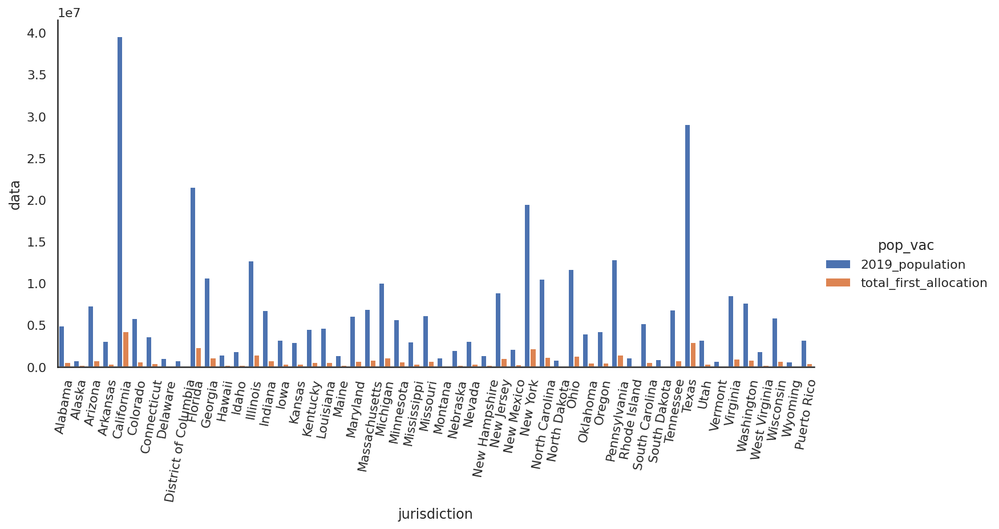

In [115]:
g = sns.catplot(x='jurisdiction',y='data',hue='pop_vac',data=df,
                saturation=1,kind='bar',ci=None,height=5, aspect=2)
plt.xticks(rotation=80);

# putting the population and alloction on the same scale is a bad idea

___

In [116]:
state_pop_vac_sort=state_pop_vac.sort_values(by=['total_first_allocation'],ascending=False)
state_pop_vac_sort.head()

,jurisdiction,2019_population,total_first_allocation
4,California,39512223,4226100
43,Texas,28995881,2894925
9,Florida,21477737,2313050
32,New York,19453561,2178300
38,Pennsylvania,12801989,1428475


In [117]:
state_pop_vac_sort.jurisdiction.count()

52

In [118]:
#convert to tuple
population=tuple(list(state_pop_vac_sort['2019_population']))

In [119]:
# convert to tuple
allocation=tuple(list(state_pop_vac_sort['total_first_allocation']))

In [120]:
# convert to tuple
jurisdiction=tuple(list(state_pop_vac_sort['jurisdiction']))

**Top 10 states with the most population, and value on top of each bar are the total vaccine allocation**

No handles with labels found to put in legend.


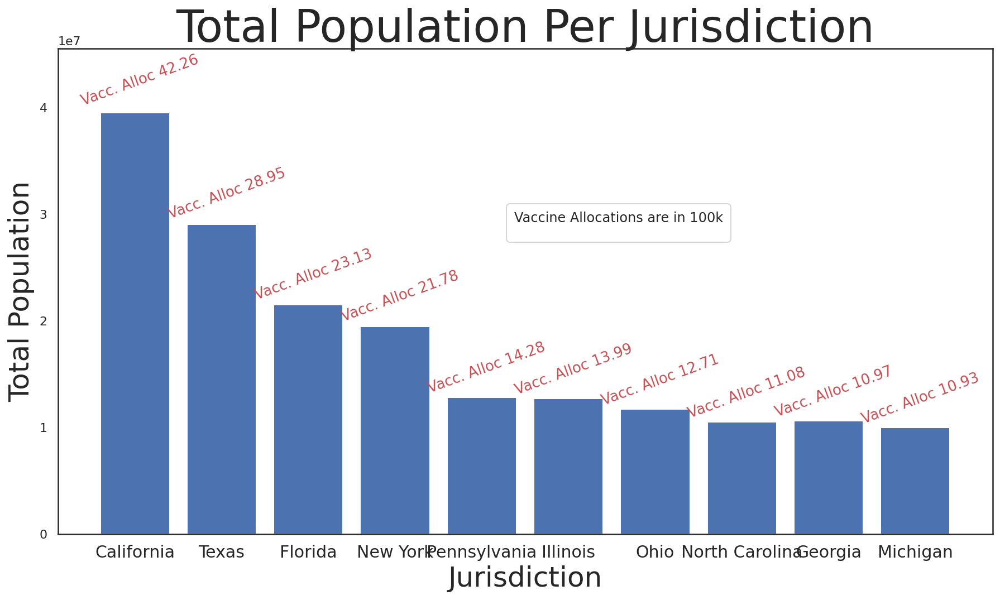

In [122]:
#https://matplotlib.org/examples/api/barchart_demo.html

#N=state_pop_vac_sort.jurisdiction.count()
N=10
population=tuple(list(state_pop_vac_sort['2019_population'].head(10)))
allocation=tuple(list(state_pop_vac_sort['total_first_allocation'].head(10)))
jurisdiction=tuple(list(state_pop_vac_sort['jurisdiction'].head(10)))

ind=np.arange(N)
width=0.8

fig,ax=plt.subplots(figsize=(15,8))
rects1=ax.bar(ind,population,width)#,color='#87CEFA')

ax.set_ylabel('Total Population',size=25)
ax.set_title('Total Population Per Jurisdiction',size=40)
ax.set_xlabel('Jurisdiction',size=25)
ax.set_xticks(ind)#+width/2)
ax.set_xticklabels(jurisdiction)

plt.xticks(size=15)
plt.ylim([0, 45512223])
plt.legend(fontsize='x-large',loc='upper center',title='Vaccine Allocations are in 100k',
          bbox_to_anchor=(0.6, 0.7))
# plt.ticklabel_format(style='plain',axis='y')

# attach a text label above each bar displaying each state's vaccine allocation
def autolabel(rects):
    n=-1
    for rect in rects:
        n+=1
        pop=rect.get_height() #getting the height of the text
        ax.text(rect.get_x()+rect.get_width()/2.+0.06,1.01*pop,
                'Vacc. Alloc'' ''%.2f'%(allocation[n]/100_000),
                ha='center',va='bottom',color='r',fontsize=13,rotation=20)
        
autolabel(rects1)

plt.savefig('../images/total_population_vac_alloc_top.png')

---

**Total Population per state with the bar text been the vaccine allocation per state**

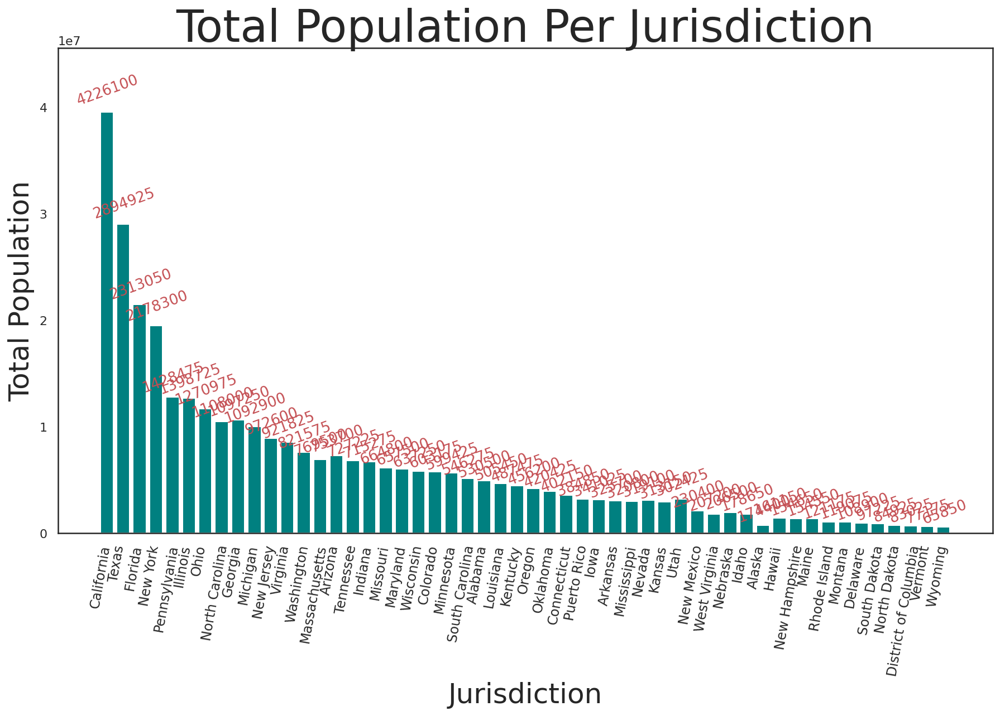

In [123]:
#https://matplotlib.org/examples/api/barchart_demo.html

N=state_pop_vac_sort.jurisdiction.count()

population=tuple(list(state_pop_vac_sort['2019_population']))
allocation=tuple(list(state_pop_vac_sort['total_first_allocation']))
jurisdiction=tuple(list(state_pop_vac_sort['jurisdiction']))

ind=np.arange(N)
width=0.8

fig,ax=plt.subplots(figsize=(15,8))
rects1=ax.bar(ind,population,width,color='teal')

ax.set_ylabel('Total Population',size=25)
ax.set_title('Total Population Per Jurisdiction',size=40)
ax.set_xlabel('Jurisdiction',size=25)
ax.set_xticks(ind-width/2)
ax.set_xticklabels(jurisdiction)

plt.xticks(size=12,rotation=80)
plt.ylim([0, 45512223])
# plt.ticklabel_format(style='plain',axis='y')

# attach a text label above each bar displaying each state's vaccine allocation
def autolabel(rects):
    n=-1
    for rect in rects:
        n+=1
        pop=rect.get_height() #getting the height of the text
        ax.text(rect.get_x()+rect.get_width()/2.+0.06,1.01*pop,
                '%d'%(allocation[n]),
                ha='center',va='bottom',color='r',fontsize=13,rotation=20)
        
autolabel(rects1)

plt.savefig('../images/total_pop_vac_alloc_top.png')

---

**all the states with their total vaccine allocation, the text on each bar are allocation too**

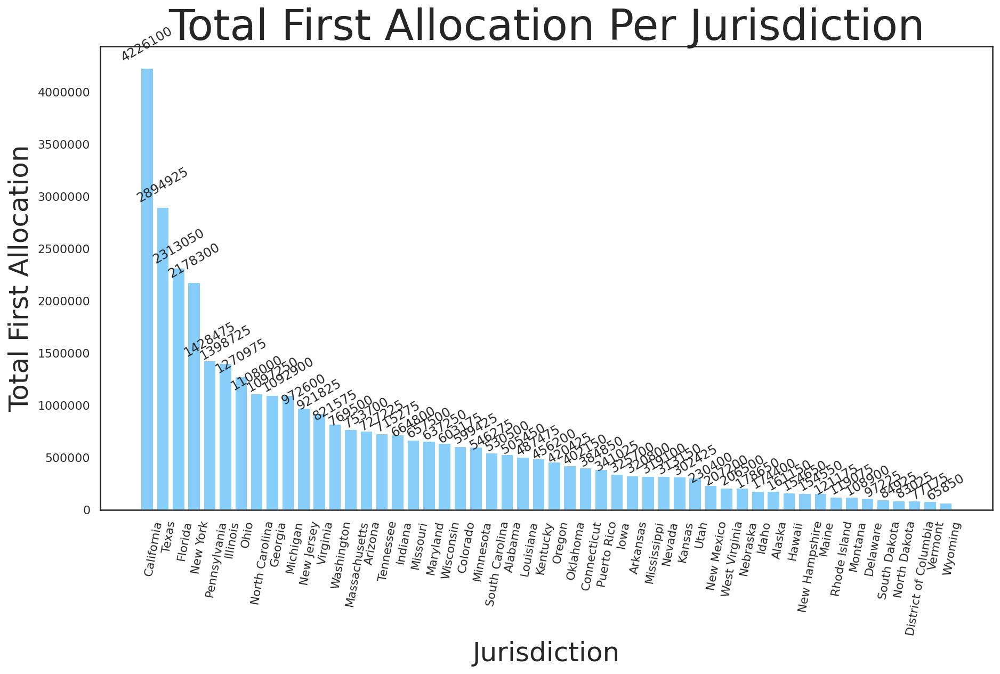

In [125]:
#https://matplotlib.org/examples/api/barchart_demo.html

N=state_pop_vac_sort.jurisdiction.count()
allocation=tuple(list(state_pop_vac_sort['total_first_allocation']))
jurisdiction=tuple(list(state_pop_vac_sort['jurisdiction']))

ind=np.arange(N)
width=0.8

fig,ax=plt.subplots(figsize=(15,8))
rects1=ax.bar(ind,allocation,width,color='#87CEFA')

ax.set_ylabel('Total First Allocation',size=25)
ax.set_title('Total First Allocation Per Jurisdiction',size=40)
ax.set_xlabel('Jurisdiction',size=25)
ax.set_xticks(ind+width/2)
ax.set_xticklabels(jurisdiction)

plt.xticks(rotation=80)
plt.ticklabel_format(style='plain',axis='y')

# attach a text label above each bar displaying its allocation
def autolabel(rects):
    for rect in rects:
        alloc=rect.get_height()#这一步是提取allocation的数字
        ax.text(rect.get_x()+rect.get_width()/2.,1.01*alloc,
               '%d'%int(alloc),ha='center',va='bottom',rotation=30)
autolabel(rects1)

plt.savefig('../images/allocation_per_jurisdiction_light_blue.png')

In [126]:
state_pop_vac_sort_10=state_pop_vac_sort[:10].reset_index(drop=True)
state_pop_vac_sort_10.rename(columns={'2019_population':'population'},inplace=True)

No handles with labels found to put in legend.


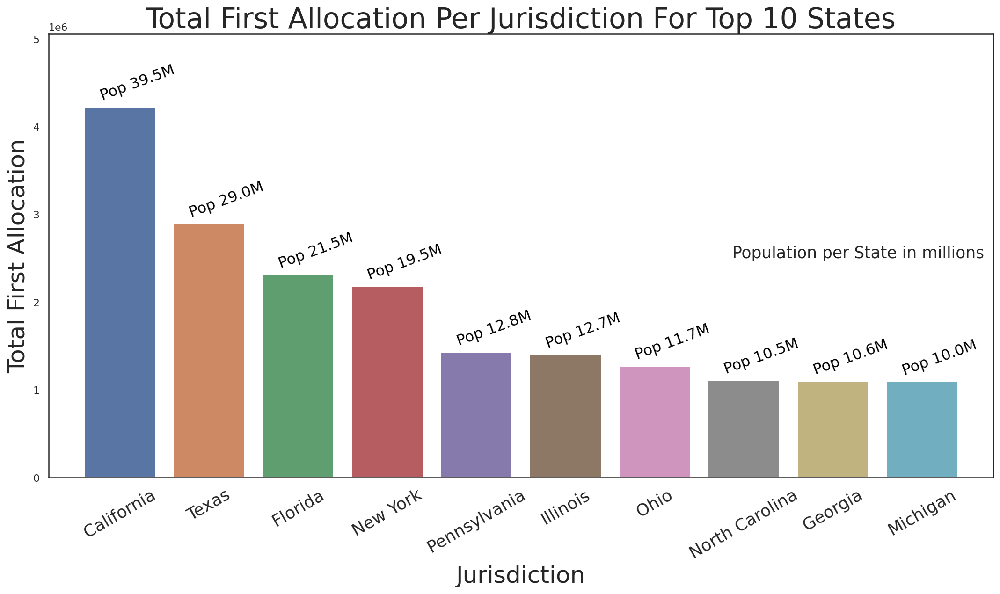

In [128]:
plt.figure(figsize=(15,9))


g=sns.barplot(data=state_pop_vac_sort_10,y=state_pop_vac_sort_10['total_first_allocation'],
              x=state_pop_vac_sort_10['jurisdiction'])#,palette='Paired')
#              linewidth=2.5, facecolor=(1, 1, 1, 0),
#                  errcolor=".2", edgecolor=".2")

#plt.ticklabel_format(style='plain',axis='y')
plt.xlabel("Jurisdiction",size=25)
plt.ylabel("Total First Allocation",size=25)
plt.title('Total First Allocation Per Jurisdiction For Top 10 States',size=30)
plt.ylim([0,5063275])
plt.xlim([-0.8,9.8])
plt.xticks(rotation=30,size=18)

leg=g.legend(loc='center right',frameon=False)
leg.set_title('Population per State in millions',prop={'size':'x-large'})

for index, row in state_pop_vac_sort_10.iterrows():
    g.text(row.name+0.2,row.total_first_allocation+80000,
           'Pop'' ''{0:.1f}M'.format(row.population/1000_000),
           color='black',ha='center',rotation=20,size=16)

plt.tight_layout()
plt.savefig('../images/allocation_population_per_top_10_state.png')

In [129]:
vac_408=pd.read_csv('../data/vaccinations_1611712808.csv')

In [130]:
vac_408.tail(12)

,state,total_doses_distributed,total_doses_administered,doses_distributed_100k,doses_administed_100k,people_1+_dose,doses_1+_100k,people_2_doses,doses_2_100k
51,South Dakota,117725,82823,13307.0,9362.0,64012,7236.0,18753,18753
52,Tennessee,838925,467933,12284.0,6852.0,365235,5348.0,101657,101657
53,Texas,3342350,1917896,11527.0,6614.0,1614648,5569.0,301684,301684
54,Utah,374850,230418,11692.0,7187.0,196507,6129.0,25817,25817
55,Virginia,1172375,594828,13735.0,6969.0,497055,5823.0,72628,72628
56,Veterans Health,1260325,703351,NaN,NaN,600904,NaN,101749,101749
57,Virgin Islands,15700,3747,14998.0,3579.0,3251,3106.0,496,496
58,Vermont,92925,54416,14892.0,8721.0,43994,7050.0,10349,10349
59,Washington,960800,507610,12617.0,6666.0,420728,5525.0,76144,76144
60,Wisconsin,685100,318096,11767.0,5463.0,268091,4604.0,48017,48017


In [131]:
vac_408.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   state                     63 non-null     object 
 1   total_doses_distributed   63 non-null     int64  
 2   total_doses_administered  63 non-null     int64  
 3   doses_distributed_100k    59 non-null     float64
 4   doses_administed_100k     59 non-null     float64
 5   people_1+_dose            63 non-null     int64  
 6   doses_1+_100k             59 non-null     float64
 7   people_2_doses            63 non-null     int64  
 8   doses_2_100k              63 non-null     int64  
dtypes: float64(3), int64(5), object(1)
memory usage: 4.6+ KB


In [132]:
vac_408.dropna(inplace=True)

In [133]:
vac_408.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59 entries, 0 to 62
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   state                     59 non-null     object 
 1   total_doses_distributed   59 non-null     int64  
 2   total_doses_administered  59 non-null     int64  
 3   doses_distributed_100k    59 non-null     float64
 4   doses_administed_100k     59 non-null     float64
 5   people_1+_dose            59 non-null     int64  
 6   doses_1+_100k             59 non-null     float64
 7   people_2_doses            59 non-null     int64  
 8   doses_2_100k              59 non-null     int64  
dtypes: float64(3), int64(5), object(1)
memory usage: 4.6+ KB


In [134]:
#perpare a df for catplot

df=pd.melt(vac_408[['state','total_doses_distributed','total_doses_administered']],\
           id_vars='state',var_name='dis_vs_adm',value_name='data')
df.head()

,state,dis_vs_adm,data
0,Alaska,total_doses_distributed,162925
1,Alabama,total_doses_distributed,569000
2,Arkansas,total_doses_distributed,394775
3,American Samoa,total_doses_distributed,18450
4,Arizona,total_doses_distributed,837200


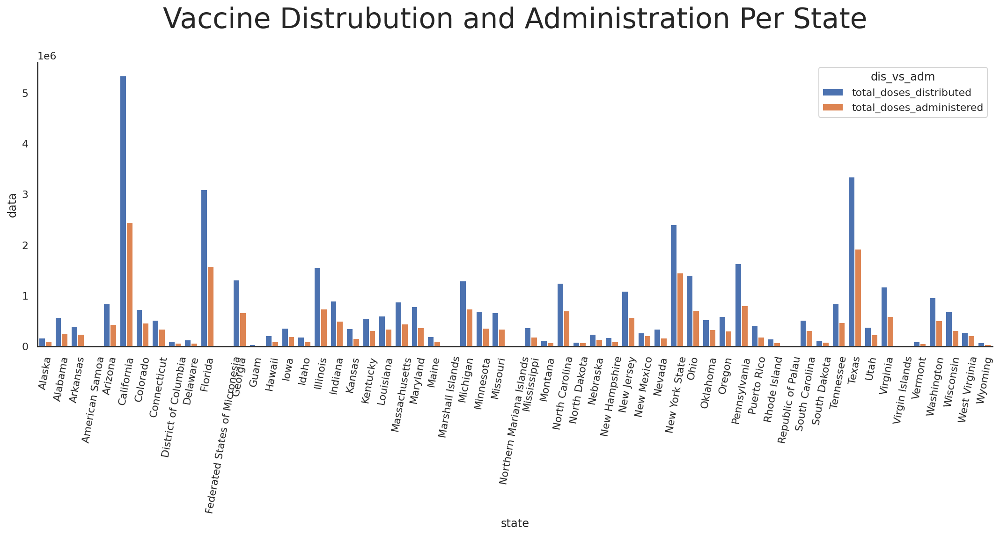

In [135]:
g=sns.catplot(x='state',y='data',hue='dis_vs_adm',legend_out=False,
                data=df,saturation=1,kind='bar',height=5, aspect=3)
plt.xticks(rotation=80)
plt.title('Vaccine Distrubution and Administration Per State',size=30,y=1.1);

#Vaccine Allocation and Administration per state in alphabet order

In [136]:
#make a df that's sorted by the doses number for catplot 

df_sort=df.sort_values(by='data',ascending=False)
df_sort.head()

,state,dis_vs_adm,data
5,California,total_doses_distributed,5340275
50,Texas,total_doses_distributed,3342350
10,Florida,total_doses_distributed,3095350
64,California,total_doses_administered,2446577
39,New York State,total_doses_distributed,2401900


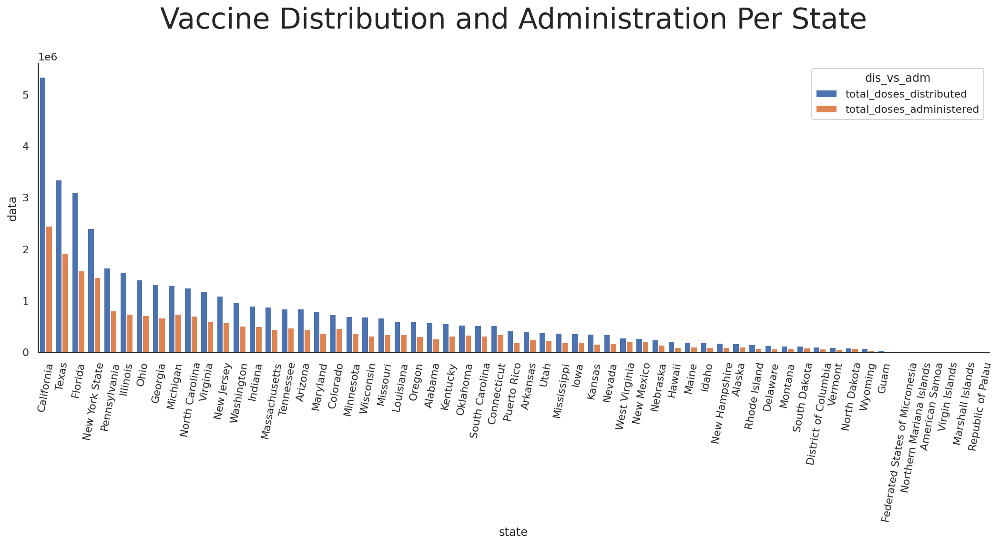

In [137]:
g=sns.catplot(x='state',y='data',hue='dis_vs_adm',legend_out=False,
                data=df_sort,saturation=1,kind='bar',height=5, aspect=3)
plt.xticks(rotation=80)
plt.title('Vaccine Distribution and Administration Per State',size=30,y=1.1);

# vaccine allocation and administration per state in the order of total doses distributed

In [138]:
# sort the original vaccine dataframe by total doses distributed, only keep the top 10

vac_408_sort=vac_408.sort_values(by='total_doses_distributed',ascending=False)[:10]
vac_408_sort.head()

,state,total_doses_distributed,total_doses_administered,doses_distributed_100k,doses_administed_100k,people_1+_dose,doses_1+_100k,people_2_doses,doses_2_100k
6,California,5340275,2446577,13516.0,6192.0,2053652,5198.0,387563,387563
53,Texas,3342350,1917896,11527.0,6614.0,1614648,5569.0,301684,301684
12,Florida,3095350,1575490,14412.0,7335.0,1412466,6576.0,158886,158886
42,New York State,2401900,1453972,12347.0,7474.0,1245215,6401.0,189791,189791
46,Pennsylvania,1636675,800354,12785.0,6252.0,657711,5138.0,141304,141304


In [139]:
df_sort_10=pd.melt(vac_408_sort[['state','total_doses_distributed','total_doses_administered']],\
           id_vars='state',var_name='dis_vs_adm',value_name='data')
df_sort_10.head()

,state,dis_vs_adm,data
0,California,total_doses_distributed,5340275
1,Texas,total_doses_distributed,3342350
2,Florida,total_doses_distributed,3095350
3,New York State,total_doses_distributed,2401900
4,Pennsylvania,total_doses_distributed,1636675


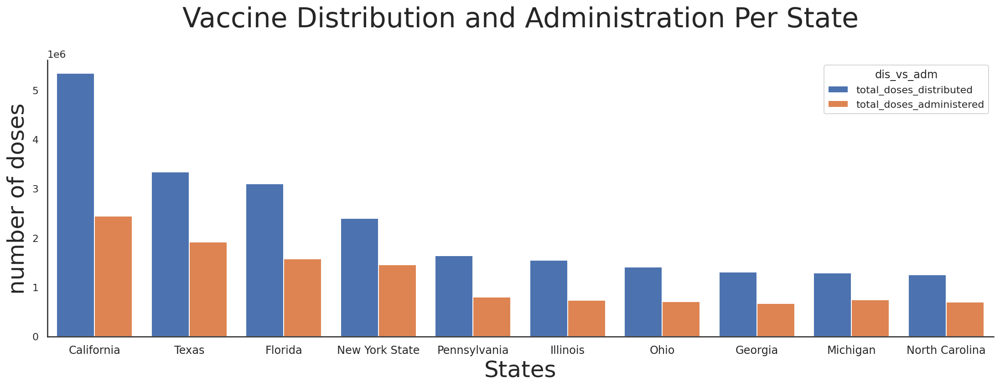

In [140]:
g=sns.catplot(x='state',y='data',hue='dis_vs_adm',legend_out=False,
                data=df_sort_10,saturation=1,kind='bar',height=5, aspect=3)
plt.xticks(size=12)
plt.title('Vaccine Distribution and Administration Per State',size=30,y=1.1)
plt.xlabel('States',size=25)
plt.ylabel('number of doses',size=25);

#the top 10 states with the most total doses distributed, versus the total doses administered 

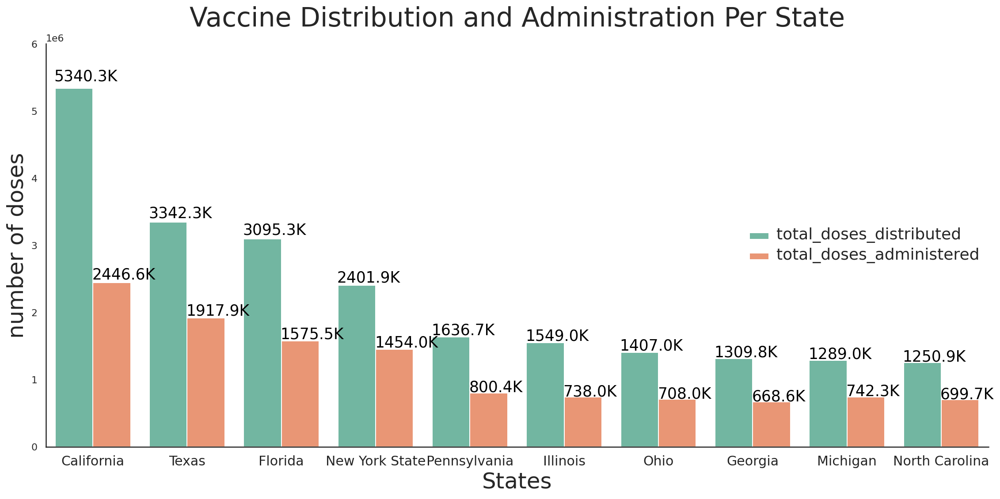

In [141]:
#https://stackoverflow.com/questions/55586912/seaborn-catplot-set-values-over-the-bars

#sns.set_palette("YlOrBr")
g = sns.catplot(x='state', y='data', data=df_sort_10, kind='bar', hue='dis_vs_adm',
                legend_out=False,palette=('Set2'),)

g.fig.set_size_inches(16,8)
g.fig.subplots_adjust(top=0.81,right=0.86) 
plt.xticks(size=15)
plt.title('Vaccine Distribution and Administration Per State',size=30,y=1.03)
plt.xlabel('States',size=25)
plt.ylabel('number of doses',size=25)
plt.ylim([0,6000000])
plt.legend(loc='center right',frameon=False)

for ax in g.axes.flat:
    plt.setp(ax.get_legend().get_texts(), fontsize='18') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title;


ax = g.facet_axis(0,0)
for p in ax.patches:
    ax.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{0:.1f}K'.format(p.get_height()/1000),   #Used to format it K representation
            color='black', 
            rotation='horizontal', 
            size='x-large')
    
plt.tight_layout()    
plt.savefig('../images/Vaccine_Distribution_and_Administration_per_State.png')

## EDA California Vaccine Administration

In [142]:
ca=pd.read_csv('../clean_data/scrapped_ca_vaccine.csv')

In [143]:
ca_1=pd.melt(ca[['date','total_doses_distributed','total_doses_administered']],\
       id_vars='date',var_name='dis_adm',value_name='doses')
ca_1.head(1)

,date,dis_adm,doses
0,2021-01-16,total_doses_distributed,3548575


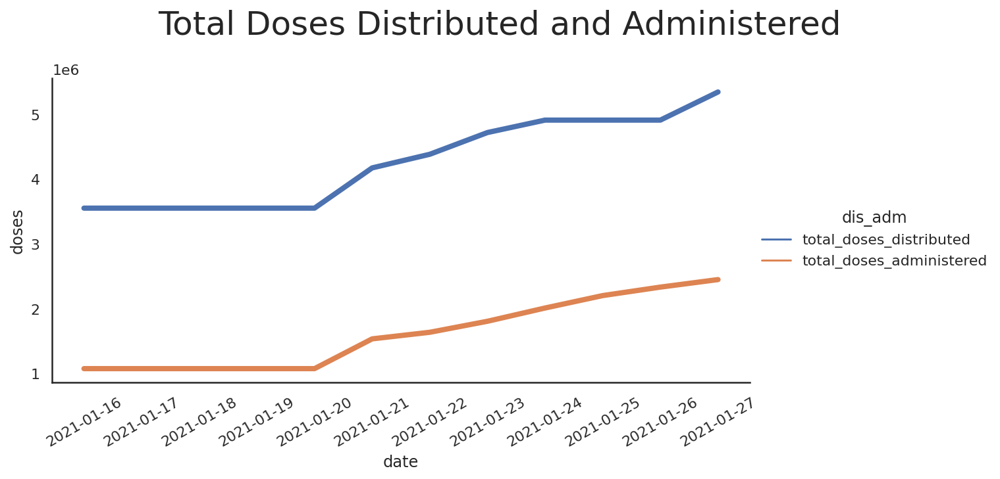

In [144]:
sns.set(style='white')
g=sns.relplot(x='date',y='doses',data=ca_1,kind='line',hue='dis_adm',height=4,
              aspect=2,linewidth = 4)
g.fig.suptitle("Total Doses Distributed and Administered",size=25,y=1.1)
g.set_xticklabels(rotation=30);

In [145]:
ca_2=pd.melt(ca[['date','total_doses_distributed','total_doses_administered','daily_change_dist','daily_change_admin']],\
       id_vars='date',var_name='dis_adm',value_name='doses')
ca_2.head(1)

,date,dis_adm,doses
0,2021-01-16,total_doses_distributed,3548575.0


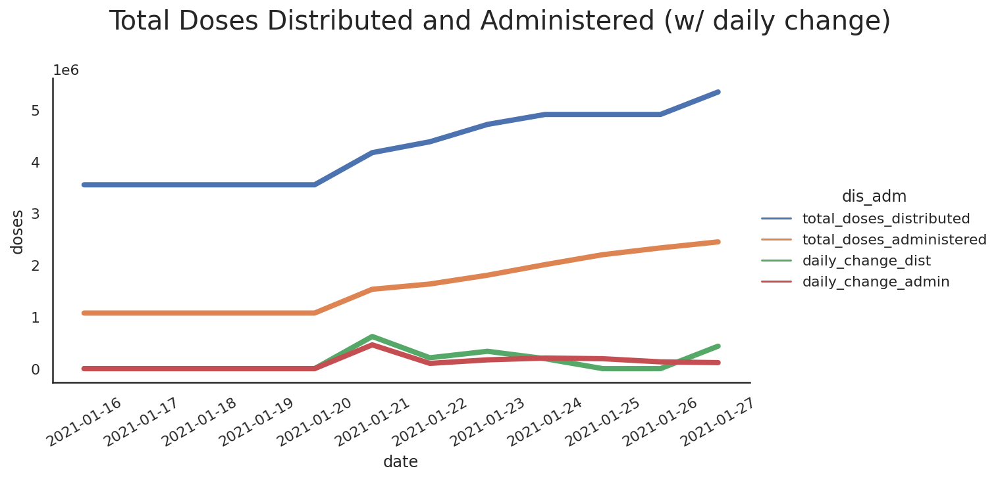

In [146]:
sns.set(style='white')
g=sns.relplot(x='date',y='doses',data=ca_2,kind='line',hue='dis_adm',height=4,
              aspect=2,linewidth = 4)
g.fig.suptitle("Total Doses Distributed and Administered (w/ daily change)",size=20,y=1.1)
g.set_xticklabels(rotation=30)
g.savefig('California_doses_distributed_administered');

In [147]:
ca_3=pd.melt(ca[['date','doses_distributed_100k','dist_100k_change','doses_administed_100k','admin_100k_change']],\
       id_vars='date',var_name='dis_adm_100',value_name='doses')
ca_3.head(1)

,date,dis_adm_100,doses
0,2021-01-16,doses_distributed_100k,8981.0


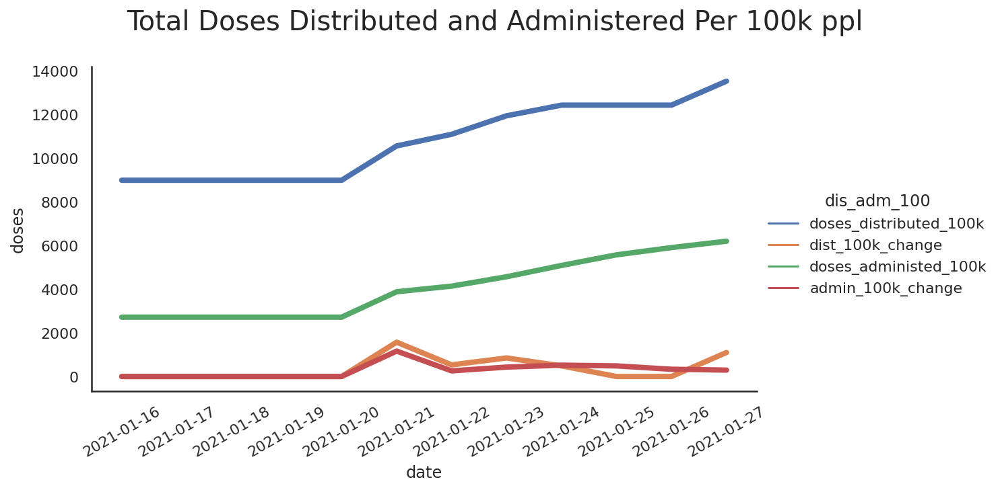

In [148]:
sns.set(style='white')
g=sns.relplot(x='date',y='doses',data=ca_3,kind='line',hue='dis_adm_100',height=4,
              aspect=2,linewidth = 4)
g.fig.suptitle("Total Doses Distributed and Administered Per 100k ppl",size=20,y=1.1)
g.set_xticklabels(rotation=30);

# this looks the same as the total doses distributed and administered, which makes sense,
# cause it's just scaled with 100k ppl

In [149]:
ca.head(1)

,state,date,total_doses_distributed,daily_change_dist,total_doses_administered,daily_change_admin,doses_distributed_100k,dist_100k_change,doses_administed_100k,admin_100k_change,people_1+_dose,people_1+_dose_change,doses_1+_100k,doses_1+_100k_change,people_2_doses,people_2_doses_change,doses_2_100k,doses_2_100k_change
0,California,2021-01-16,3548575,0.0,1072959,0.0,8981.0,0.0,2716.0,0.0,865387,0.0,2190.0,0.0,204374,0.0,204374,0.0


In [150]:
ca_4=pd.melt(ca[['date','people_1+_dose','people_1+_dose_change','people_2_doses','people_2_doses_change']],\
       id_vars='date',var_name='ppl_dose',value_name='doses')
ca_4.head(1)

,date,ppl_dose,doses
0,2021-01-16,people_1+_dose,865387.0


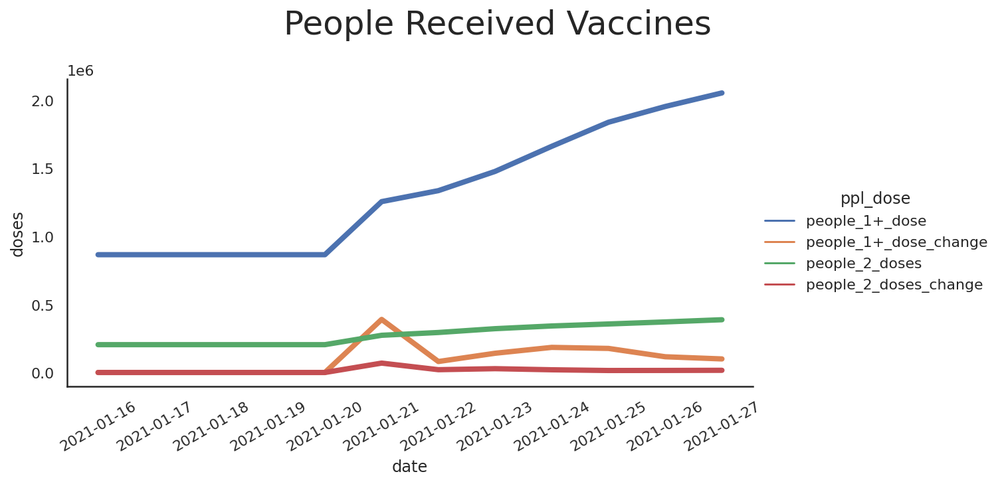

In [151]:
sns.set(style='white')
g=sns.relplot(x='date',y='doses',data=ca_4,kind='line',hue='ppl_dose',height=4, aspect=2,
             linewidth = 4)
g.fig.suptitle("People Received Vaccines",size=25,y=1.1)
g.set_xticklabels(rotation=30);

# the increase of people who receiving 1 or more doses peaked on 01/21, but decreased after that

## Hospitals Beds Per County EDA

In [152]:
# importing the county cases mask data
data_mask = pd.read_csv('../clean_data/cases_with_mask_use.csv')

In [153]:
data_mask.head()

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS,population
0,Santa Clara,151.0,6.0,151,6,2020-03-18,0.015,0.014,0.04,0.168,0.764,1927852
1,Santa Clara,183.0,8.0,32,2,2020-03-19,0.015,0.014,0.04,0.168,0.764,1927852
2,Santa Clara,246.0,8.0,63,0,2020-03-20,0.015,0.014,0.04,0.168,0.764,1927852
3,Santa Clara,269.0,10.0,23,2,2020-03-21,0.015,0.014,0.04,0.168,0.764,1927852
4,Santa Clara,284.0,13.0,15,3,2020-03-22,0.015,0.014,0.04,0.168,0.764,1927852


#### Creating Confirmed population density column

In [154]:
# create a data frame to get by county confirmed patients.
df_confirm = data_mask[data_mask['date']== '2021-01-24'][['county','totalcountconfirmed' , 'population']]
df_confirm['confirm_percent'] = (df_confirm['totalcountconfirmed'])*100 / (df_confirm['population'])
df_confirm.set_index('county' , inplace = True)

In [155]:
# create a data frame to get by county confirmed patients.
#df_confirm = pd.DataFrame(data_mask.groupby(by = 'county')['totalcountconfirmed'].max())
#df_confirm['population'] = data_mask.groupby(by = 'county')['population'].max()
#df_confirm['confirm_percent'] = (df_confirm['totalcountconfirmed'])*100 / (df_confirm['population'])

In [156]:
# lets take a look at the data
df_confirm.head()

,totalcountconfirmed,population,confirm_percent
county,,,
Santa Clara,98103.0,1927852,5.088721
San Mateo,33956.0,766573,4.429585
Santa Barbara,26735.0,446499,5.987695
Tuolumne,3416.0,54478,6.270421
Sierra,42.0,3005,1.397671


#### Using Geopandas for plotting

In [157]:
# set the filepath and load in a shapefile
map_df = gpd.read_file('../data/CA_Counties/CA_Counties_TIGER2016.shp')

In [158]:
map_df.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,091,00277310,06091,Sierra,Sierra County,06,H1,G4020,None,None,None,A,2468694587,23299110,+39.5769252,-120.5219926,"POLYGON ((-13431319.751 4821511.426, -13431312..."
1,06,067,00277298,06067,Sacramento,Sacramento County,06,H1,G4020,472,40900,None,A,2499183617,76073827,+38.4500114,-121.3404409,"POLYGON ((-13490651.476 4680831.603, -13490511..."
2,06,083,00277306,06083,Santa Barbara,Santa Barbara County,06,H1,G4020,None,42200,None,A,7084000598,2729814515,+34.5370572,-120.0399729,"MULTIPOLYGON (((-13423116.772 4042044.149, -13..."
3,06,009,01675885,06009,Calaveras,Calaveras County,06,H1,G4020,None,None,None,A,2641820834,43806026,+38.1838996,-120.5614415,"POLYGON ((-13428575.483 4627725.228, -13428534..."
4,06,111,00277320,06111,Ventura,Ventura County,06,H1,G4020,348,37100,None,A,4773390489,945942791,+34.3587415,-119.1331432,"MULTIPOLYGON (((-13317853.594 3931602.414, -13..."


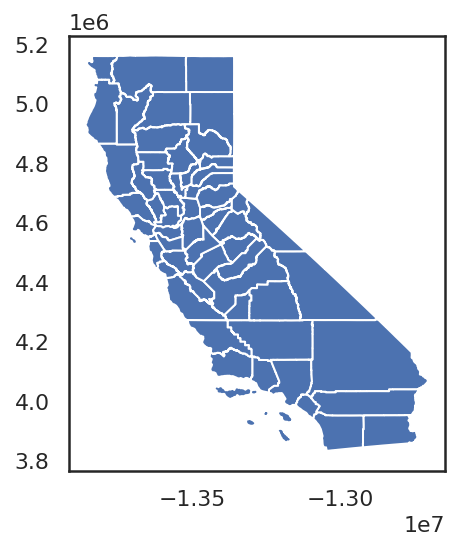

In [159]:
map_df.plot();

#### join the geodataframe with the cleaned up csv dataframe

In [160]:
merged = map_df.set_index('NAME').join(df_confirm)

In [161]:
merged.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,totalcountconfirmed,population,confirm_percent
NAME,,,,,,,,,,,,,,,,,,,,
Sierra,06,091,00277310,06091,Sierra County,06,H1,G4020,None,None,None,A,2468694587,23299110,+39.5769252,-120.5219926,"POLYGON ((-13431319.751 4821511.426, -13431312...",42.0,3005,1.397671
Sacramento,06,067,00277298,06067,Sacramento County,06,H1,G4020,472,40900,None,A,2499183617,76073827,+38.4500114,-121.3404409,"POLYGON ((-13490651.476 4680831.603, -13490511...",84110.0,1552058,5.419256
Santa Barbara,06,083,00277306,06083,Santa Barbara County,06,H1,G4020,None,42200,None,A,7084000598,2729814515,+34.5370572,-120.0399729,"MULTIPOLYGON (((-13423116.772 4042044.149, -13...",26735.0,446499,5.987695
Calaveras,06,009,01675885,06009,Calaveras County,06,H1,G4020,None,None,None,A,2641820834,43806026,+38.1838996,-120.5614415,"POLYGON ((-13428575.483 4627725.228, -13428534...",1704.0,45905,3.712014
Ventura,06,111,00277320,06111,Ventura County,06,H1,G4020,348,37100,None,A,4773390489,945942791,+34.3587415,-119.1331432,"MULTIPOLYGON (((-13317853.594 3931602.414, -13...",66347.0,846006,7.842379


In [162]:
merged["confirm_percent"].describe()

count    58.000000
mean      6.338709
std       3.032444
min       1.397671
25%       4.285541
50%       5.921240
75%       7.957626
max      15.791712
Name: confirm_percent, dtype: float64

#### Plotting the density data by County

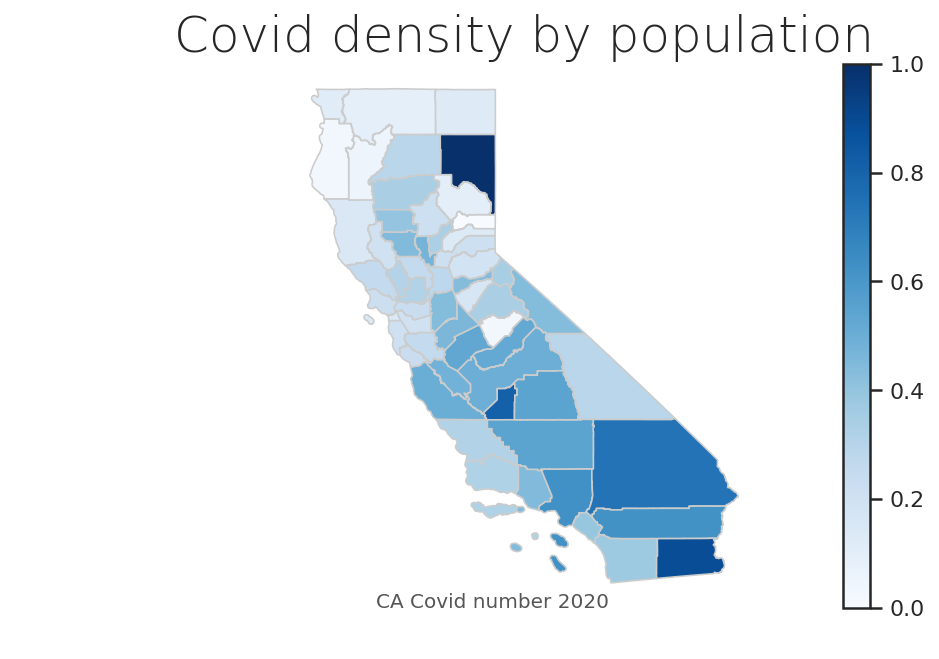

In [163]:
# set a variable that will call whatever column we want to visualise on the map
variable = 'confirm_percent'

# set the range for the choropleth
vmin, vmax = 0 , 1

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(15, 5))

# create map
merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

# Now we can customise and add annotations

# remove the axis
ax.axis('off')

# add a title
ax.set_title('Covid density by population', \
              fontdict={'fontsize': '25',
                        'fontweight' : '3'})

# create an annotation for the  data source
ax.annotate('CA Covid number 2020',
           xy=(0.4, 0.1), xycoords='figure fraction',
           horizontalalignment='left', verticalalignment='top',
           fontsize=10, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)

# this will save the figure as a high-res png. you can also save as svg
fig.savefig('../images/covid_density_by_population.png')